In [1]:
!pip install networkx

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
!pip install seaborn

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [3]:
import networkx as nx

import os
import shutil 
import numpy as np
import pandas as pd
import gc
import json
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from spektral.data import Dataset, Graph, SingleLoader, BatchLoader, DisjointLoader
from spektral.layers import GCNConv
from spektral.utils import normalized_adjacency, gcn_filter, degree_matrix
from spektral.models.gcn import GCN 
from spektral.datasets.utils import DATASET_FOLDER

from scipy import sparse
from scipy.special import softmax

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,roc_auc_score,accuracy_score

from keras.callbacks import EarlyStopping, ModelCheckpoint


In [4]:

# def plot_graph_dir(G, communities=None):
#     pos = nx.spring_layout(G, seed=42)
    
#     if communities is not None:
#         # Assign colors to nodes based on their communities
#         colors = ['orange' if community == 0 else 'skyblue' for community in communities]
#     else:
#         colors = 'red'

#     nx.draw_networkx(G, pos, arrows=True, node_color=colors, with_labels=True)
#     plt.show()




In [5]:
def plot_graph(G, communities=None):
    pos = nx.spring_layout(G, seed=42)
    
    if communities is not None:
        # Assign colors to nodes based on their communities
        colors = ['orange' if community == 0 else 'skyblue' for community in communities]
    else:
        colors = 'red'

    nx.draw(G, pos, node_color=colors, with_labels=True)
    plt.show()

# Nueva clase para generar grafos sintéticos (siguiendo a Carson)

### Funciones necesarias para definir la clase

In [6]:
def generate_ssbm(num_nodes,num_classes,p_intra,p_inter,community = None):
    """
    Adapted from: https://github.com/brownthesr/Synthetic-Graphs/blob/main/src/generate_data.py#L49
    
    Generates a SSBM.

    This function generates a Symmetric Stochastic Block model. It does
    this by creating blocks for in and out of class probability. Then
    it draws from a uniform distribution and uses the p_intra and p_inter
    probabilities to assign edges between specific nodes

    Args:
        num_nodes (int): The number of nodes.
        num_classes (int): The number of classes.
        p_intra (float): The probability of having
            in class connections.
        p_inter (float): The probability of having
            edges between classes
        community (list): Optional, may specify how
            the nodes are divided into communities.
            Automatically assigns communities if none
            are provided.

    Returns:
        Graph (list): An adjacency matrix representing the
            edges in the generated graph.
        Communities (list): The node assignment to communities.
    """
    #### TATI: podriamos pasarle como argumento las clases desbalanceadas ####
    if community is None: 
         #### TATI: esto genera clases balanceadas ####
        # assign a community to each node
        community = np.repeat(list(range(num_classes)),np.ceil(num_nodes/num_classes))
        
        #### TATI: le agrego shuffle para que se mezclen los nodos y no queden primero todos los de clase 0,
        ####       y luego todos los de clase 1
        np.random.shuffle(community) 
        #np.repeat(list to iterate over, how many times to repeat an item)

        #make sure community has size n
        community = community[0:num_nodes]
        # just in case repeat repeated too many

    communities = community.copy()

    # make it a collumn vector
    community = np.expand_dims(community,1)

    # generate a boolean matrix indicating whether
    # two nodes share a community
    # this is a smart way to generate a section graph
    intra = community == community.T
    inter = community != community.T# we can also use np.logical not

    random = np.random.random((num_nodes,num_nodes))
    tri = np.tri(num_nodes,k=-1).astype(bool)

    #### TATI: cambie "intragraph" por "intergraph", y viceversa ####
    intragraph = (random < p_intra) * intra * tri 
    # this creates a matrix that only has trues where
    # random< p_intra, they are in intra, and along half the matrix
    # (if it were the whole matrix it would be double the edges we want)
    intergraph = (random < p_inter) * inter * tri# same thing here
    graph = np.logical_or(intergraph,intragraph)
    graph = graph*1# this converts it to a int tensor
    #### TATI: atencion: matriz adyacencia simetrica (grafo no dirigido) ####
    graph += graph.T
    return graph,communities

In [7]:
def generate_orthogonal_vecs(num_vecs,num_dim):
    """
    Copied from https://github.com/brownthesr/Synthetic-Graphs/blob/main/src/generate_data.py#L148
    
    Generates Orthogonal vectors

    Uses a random generation process to generate num_vecs
    orthogonal vectors in num_dim dimensions.

    Args:
        num_vecs (int): The number of vectors we want to return.
        num_dim (int): The number of dimensions that we can use.

    Returns:
        vecs (list): A list of randomly orthogonal vectors
    """
    vecs = []
    assert num_vecs <= num_dim
    for i in range(num_vecs):
        orthogonal = False
        while not orthogonal:
            rand_vec = np.random.uniform(-10,10,num_dim)
            rand_vec = rand_vec/np.linalg.norm(rand_vec)
            orthogonal = True
            for j in range(len(vecs)):
                angle = np.arccos(rand_vec@vecs[j])
                if(angle < np.pi/2 - .1 or angle > np.pi/2 + .1):
                    orthogonal = False
        vecs.append(rand_vec)
        #print(len(vecs))
    return np.array(vecs)



In [8]:
def generate_csbm_TATI(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                       num_classes, community=None, seed=None):
    #### TATI: agrego argumentos community (para poder pasarle valores desbalanceados) y seed (para replicabilidad)
    """
    Adapted from https://github.com/brownthesr/Synthetic-Graphs/blob/main/src/generate_data.py#L148
    
    Creates a Contextual Stochastic Block model

    It takes the avg degree, degree separation, and feature separation
    to generate a SBM with features corrosponding to classes.

    Args:
        avg_degree (int): The average degree of all the nodes.
        degree_separation (float): The separation constrain for edges in classes and edges between classes.
        features_separation (float): A measure of how far apart the means are.
        num_features (int): The number of features to generate.
        num_nodes (int): The number nodes to generate.
        num_classes (int): The number of classes to generate

    Returns:
        Adjacency matrices for a training and testing set.
        Features for training and testing sets.
        Labels for training and testing sets.
    """
    #### TATI: agrego estas dos lineas para tener en cuenta la semilla ####
    if seed is not None:
        np.random.seed(seed)
            
    c_in = avg_degree+edge_separation_lambda*np.sqrt(avg_degree) # c_in/c_out as described in the equations
    c_out = avg_degree-edge_separation_lambda*np.sqrt(avg_degree)
    p_in = c_in/num_nodes # compiles these to pass into the SSBM
    p_out = c_out/num_nodes

    rand_vec = np.random.normal(0,1/num_features,(num_features))
    # obtains the random normal vector u how far our clouds are from the origin

    #### TATI: agrego el argumento community ####
    train_adj, train_communities = generate_ssbm(num_nodes,num_classes,p_in,p_out,community)
    # obtains the graph structure
    train_z = np.random.normal(0,.2,(num_nodes,num_features))
    # obtains the random noise vector i presume
    train_v = train_communities # puts the groups into a format for the equations

    perms = generate_orthogonal_vecs(num_classes,num_features)
    #print(communities)
    #print(perms)
    dist = np.sqrt(feature_separation_mu/num_nodes)
    train_b = np.zeros((num_nodes,num_features))
    for i in range(num_nodes):
        train_b[i] = dist*(np.diag(perms[train_v[i]])@rand_vec) + train_z[i]/np.sqrt(num_features)

    #### TATI: elimino la creacion de grafo test ####
    
    #### TATI: transformo etiquetas y matriz de adyacencia, y retorno segun el formato de spektral ####
    labels = tf.keras.utils.to_categorical(train_communities)
    adjacency_matrix = sparse.csr_matrix(train_adj)
    return Graph(x=train_b, a=adjacency_matrix, y=labels)


In [9]:
def save_parameters(parameters, filename):
    with open(filename, 'w') as f:
        json.dump(parameters, f)
        
def load_parameters(filename):
    with open(filename, 'r') as f:
        return json.load(f)


### Clase (Grafos NO dirigidos)

In [10]:
class Carson_SyntheticGraphs(Dataset): # modificacion 2024 para cacic-springer
    
    def __init__(self, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed = None, community = None, flattened = False, **kwargs):
        self.avg_degree = avg_degree
        self.edge_separation_lambda = edge_separation_lambda
        self.feature_separation_mu = feature_separation_mu
        self.num_features = num_features
        self.num_nodes = num_nodes
        self.num_classes = num_classes
        self.num_graphs = num_graphs
        self.seed = seed
        self.community = community
        self.flattened = flattened
        super().__init__(**kwargs)

    @property
    def path(self):
        dirname = f'{self.avg_degree}AvgDegree_{self.edge_separation_lambda}Lambda_\
{self.feature_separation_mu}Mu_{self.num_features}Features_{self.num_nodes}Nodes_\
{self.num_classes}Classes_{self.num_graphs}Graphs'

        return os.path.join(DATASET_FOLDER, "Carson_SyntheticGraphs", dirname)
        
        
    # Getter para obtener los argumentos utilizados
    @property
    def get_args(self):
        return {"avg_degree": self.avg_degree, "edge_separation_lambda": self.edge_separation_lambda, \
                "feature_separation_mu": self.feature_separation_mu, "num_features": self.num_features, \
                "num_nodes": self.num_nodes, "num_classes": self.num_classes, "num_graphs": self.num_graphs, \
                "seed": self.seed, "community": self.community, "flattened": self.flattened}

    
    def download(self):
        os.makedirs(self.path)
        
        parameters = self.get_args
        
        if self.seed == None:
            vector_seed = [None] * self.num_graphs
        else:
            vector_seed = self.seed
            
        if self.community == None:
            vector_community = [None] * self.num_graphs
        else:
            vector_community = self.community
            for i in range(len(self.community)):
                parameters["community"][i] = self.community[i].tolist()
                
        graphs = [generate_csbm_TATI(self.avg_degree, self.edge_separation_lambda, self.feature_separation_mu, \
                                     self.num_features, self.num_nodes, self.num_classes, vector_community[i], \
                                     vector_seed[i]) for i in range(self.num_graphs)]
        for j in range(self.num_graphs):
            filename = os.path.join(self.path, f'graph_{j:02d}.npz')
            np.savez(filename, x=graphs[j].x, a=graphs[j].a, y=graphs[j].y)
        
        save_parameters(parameters, os.path.join(self.path,"parameters.json"))
        # Free memory
        del graphs
        gc.collect()

        

    def read(self): 
        if os.path.exists(self.path):
            parameters = load_parameters(os.path.join(self.path,"parameters.json"))
        
        #### TATI: if self.seed==None entonces debería generar nuevos (no leer lo que ya está de antes).
        ####       Lo mismo si cambia alguna semilla, o si cambia la clase a la que pertenece algun nodo ####
        if ((self.seed == None) or 
            (self.seed != None and parameters["seed"] != self.get_args["seed"]) or 
            (self.community != None and (np.array(parameters["community"]) != np.array(self.get_args["community"])).any())):
            self.delete()
            self.download()           

        # We must return a list of Graph objects
        output = []

        for j in range(self.num_graphs):
            data = np.load(os.path.join(self.path, f'graph_{j:02d}.npz'), allow_pickle=True)
            #### if flattened, entonces en lugar de leer las features guardadas, asigna una matriz de todos 1 ####
            if self.flattened:
                x_features = np.ones((self.num_nodes, self.num_features))
            else:
                x_features = data['x']
            output.append(
                Graph(x=x_features, a=data['a'][()], y=data['y']) # también puede ser a=data['a'].item()
            )

        return output
    
    
    def delete(self):
        if os.path.exists(self.path):
            shutil.rmtree(self.path)


# Creación de grafos sintéticos (NO dirigidos)

In [11]:
avg_degree=10
edge_separation_lambda=3
feature_separation_mu=0.5
num_features=2
num_nodes=100
num_classes=2
num_graphs=10
seed=[123, 234, 345, 456, 567, 679, 789, 321, 654, 987]
community = None
flattened = False


In [12]:
grafos=Carson_SyntheticGraphs(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flattened)

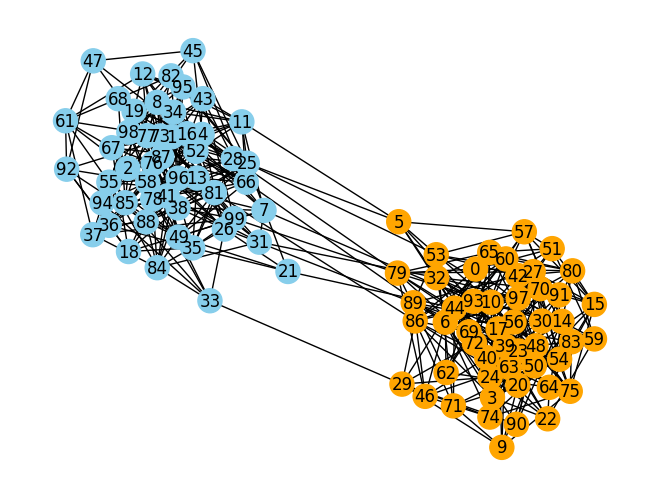

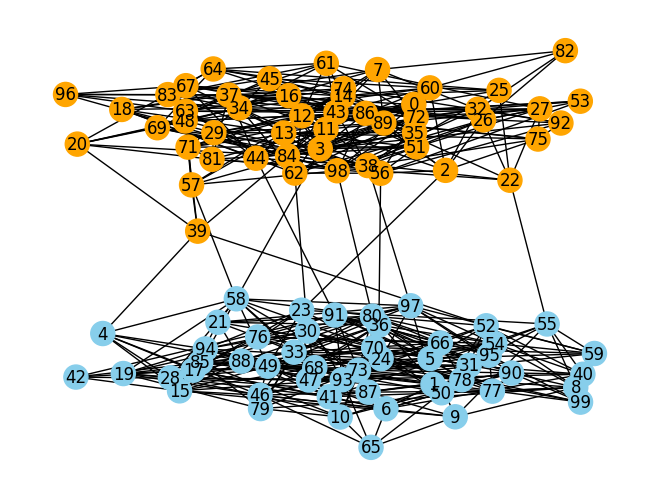

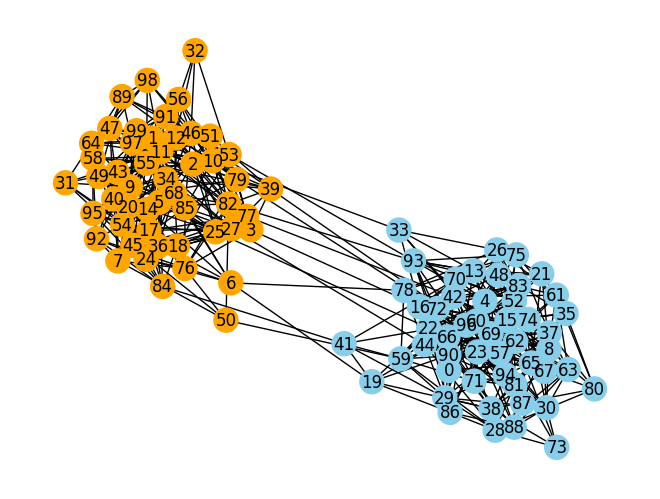

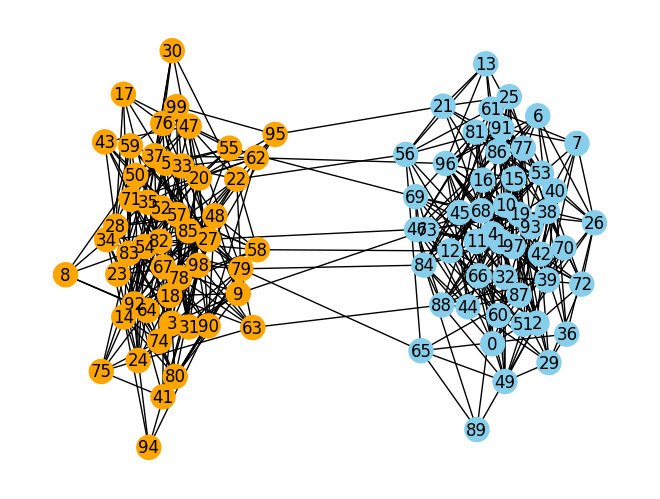

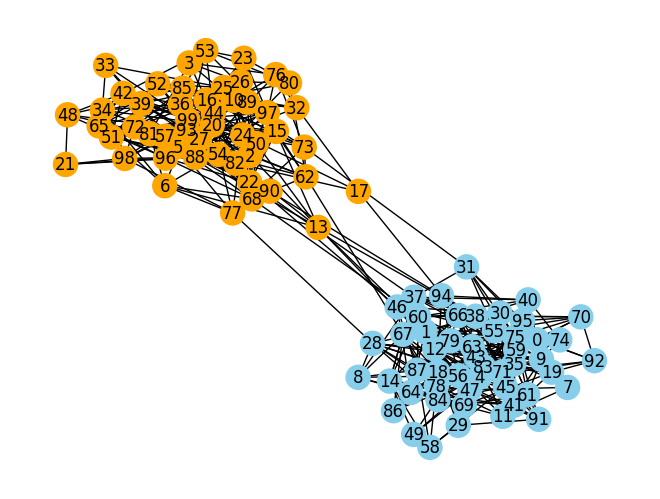

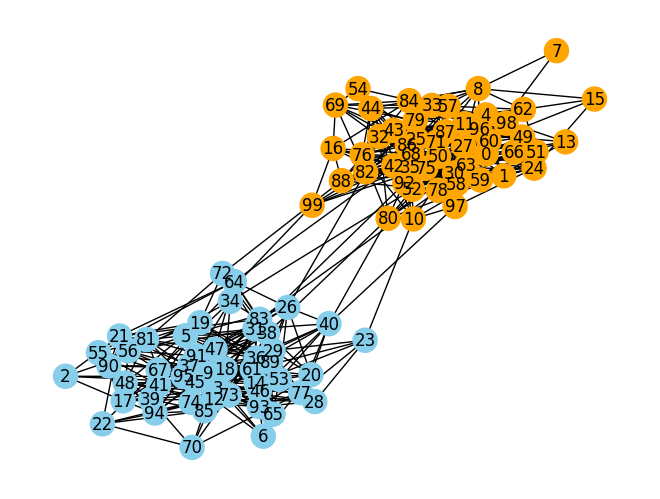

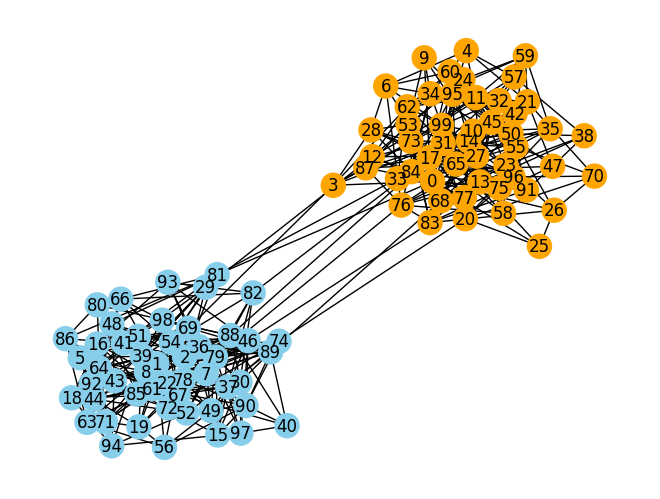

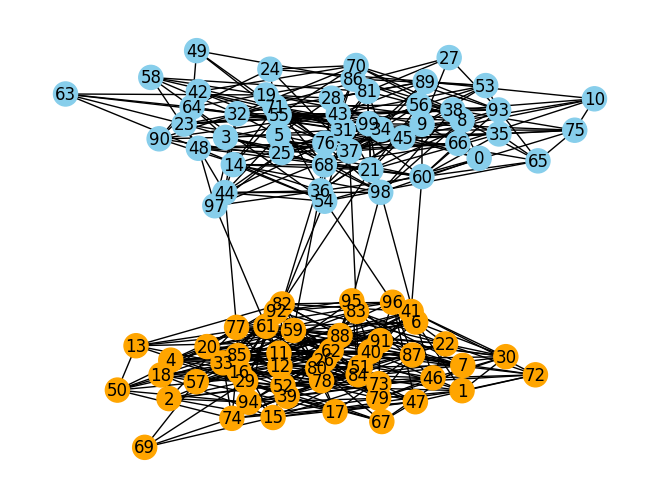

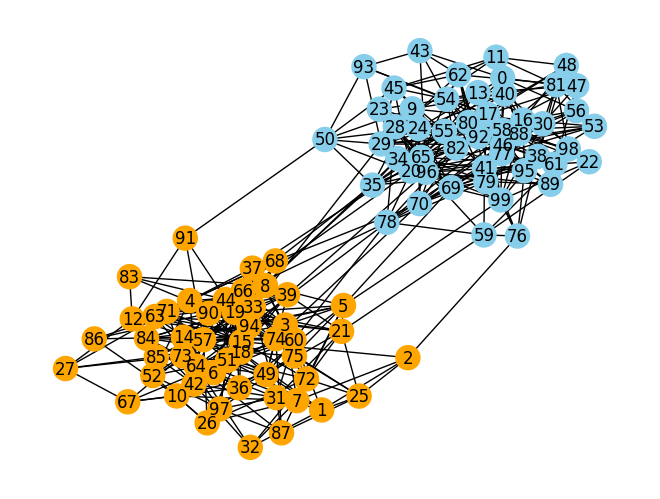

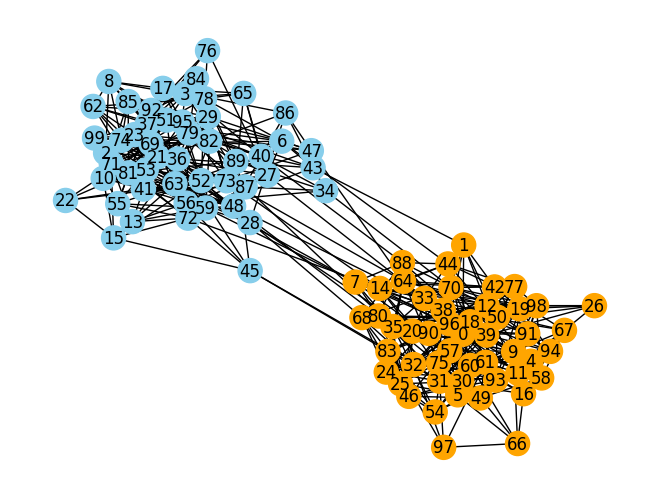

In [13]:
for G in grafos:
    nxG = nx.from_numpy_array(G.a)
    labels = np.argmax(G.y,axis=1)
    plot_graph(nxG,labels)


In [14]:
# Verificacion del grado promedio por grafo

for i in range(10):
    grados=degree_matrix(grafos[i].a).todense().sum(1)
    print(np.sum(grados)/len(grados))
    

10.38
10.04
10.46
10.02
9.76
10.48
9.08
9.94
9.04
10.1


# Entrenamiento GCN

In [15]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    print(e)


1 Physical GPUs, 1 Logical GPUs


### Funciones para preprocesar la matriz de features

In [16]:
def _preprocess_features(features):
    """
    Copy from https://github.com/danielegrattarola/spektral/blob/39fe897c5c06ce8bd8100e10fe9d373b91958cc7/spektral/datasets/citation.py#L192
    """
    rowsum = np.array(features.sum(1))
    r_inv = np.power(rowsum, -1).flatten()
    r_inv[np.isinf(r_inv)] = 0.0
    r_mat_inv = sparse.diags(r_inv)
    features = r_mat_inv.dot(features)
    return features


class GCNConv_preprocess_features(object):
    """
    Applies the `_preprocess_features` to the node features.
    
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def __call__(self, graph):
        graph.x = _preprocess_features(graph.x)
        return graph


### Función para preprocesar la matriz de adyacencia

In [17]:
class GCNConv_preprocess_adjacencyMatrix(object):
    """
    Applies the `gcn_filter` function of a GCN Layer to the adjacency
    matrix. The result depends on symmetry of adjacency matrix.

    **Arguments**

    - `layer_class`: the class of a layer from `spektral.layers.convolutional`,
    in order to verify if it is a GCNConv.
    - `symmetric`: boolean, indicates if adjacency matrix is symmetric (undirected graph),
    or if it is non-symmetric (directed graph).
    """

    def __init__(self, layer_class, symmetric):
        self.layer_class = layer_class
        self.symmetric = symmetric

    def __call__(self, graph):
        if self.layer_class == GCNConv:
            if self.symmetric:
                graph.a = gcn_filter(graph.a)
            else:
                graph.a = gcn_filter(graph.a, symmetric=False)
            return graph
        else:
            raise ValueError('The parameter must be GCNConv. For other convolutional layers, find the appropriate preprocessing')


### Función para cargar los grafos y realizar el/los preprocesamiento/s requerido/s

In [18]:
def instancia(clase, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flatten=False, symmetricAdjacency=False, \
                 preprocAdjacency=True, preprocFeatures=True):
    """
    Función para instanciar cada una de las clases que definen los diferentes conjuntos de grafos sintéticos
    """
    if preprocAdjacency and preprocFeatures:
        inst = clase(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flattened=flatten, \
                     transforms=[GCNConv_preprocess_adjacencyMatrix(GCNConv, symmetric=symmetricAdjacency), \
                                 GCNConv_preprocess_features()])
    elif preprocAdjacency and ~preprocFeatures:
        inst = clase(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flattened=flatten, \
                     transforms=[GCNConv_preprocess_adjacencyMatrix(GCNConv, symmetric=symmetricAdjacency)])
    elif ~preprocAdjacency and preprocFeatures:
        inst = clase(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flattened=flatten, \
                     transforms=[GCNConv_preprocess_features()])
    else:
        inst = clase(avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flattened=flatten)
    return inst



### Función para predecir y calcular las métricas

In [23]:
def predicciones(loader, nombre, model):
    """
    Calcula las predicciones y métricas de interés
    """
    TP_list = []
    FN_list = []
    FP_list = []
    TN_list = []
    acc = []
    prec = []
    rec = []
    esp = []
    F1 = []
    auc = []
    
    for k in range(loader.steps_per_epoch):
        inputs,target = loader.__next__()
        y_prediction = model(inputs, training=False)
        y_prediction = np.argmax(np.vstack(y_prediction), axis = 1)
        y_true=np.argmax(np.vstack(target), axis=1)
        prediccion=pd.DataFrame({"true_label":y_true, "prediction":y_prediction})
        #print(prediccion)
        #prediccion.to_csv(os.path.join(prediccionesDirectorio,f'{str(NOMBRE_PRUEBA)}_prediccion_{str(nombre)}_0{k}.csv'),index = None)
        
        #Create confusion matrix and normalizes it over predicted (columns)
        result = tf.math.confusion_matrix(y_true, y_prediction, num_classes=2) 

        # confusion_matrix = [[TP, FN],
        #                     [FP, TN]]
        TP = result[0,0].numpy()
        FN = result[0,1].numpy()
        FP = result[1,0].numpy()
        TN = result[1,1].numpy()

        accuracy = (TP+TN)/(TP+FP+FN+TN)
        precision = TP/(TP+FP)
        recall = TP/(TP+FN)
        especificity = TN/(TN+FP)
        f1 = (2*precision*recall)/(precision+recall)
        auc_score = roc_auc_score(y_true, y_prediction)
        
        TP_list.append(TP)
        FN_list.append(FN)
        FP_list.append(FP)
        TN_list.append(TN)
        acc.append(accuracy)
        prec.append(precision)
        rec.append(recall)
        esp.append(especificity)
        F1.append(f1)
        auc.append(auc_score)
        
    df = pd.DataFrame({"TP":TP_list, "FN":FN_list, "FP":FP_list, "TN":TN_list, "accuracy":acc, "precision":prec, "recall":rec, "especificity":esp, "f1":F1, "auc_score":auc})
    #df.to_csv(os.path.join(metricasDirectorio, f'{str(NOMBRE_PRUEBA)}_metricas_{str(nombre)}.csv'), index = None)
    print(df)
    return df


### Función para entrenar y evaluar

In [28]:
# k-fold, con k=10
def train_and_test(dataset, num_graphs):
    aux = {}
    for i in range(num_graphs):
        #graficasDirectorio = os.path.join(PATH_RDOS,f'prueba_0{i}/graficas')
        #prediccionesDirectorio = os.path.join(PATH_RDOS,f'prueba_0{i}/predicciones')
        #metricasDirectorio = os.path.join(PATH_RDOS,f'prueba_0{i}/metricas')

        #os.makedirs(graficasDirectorio, exist_ok = True)
        #os.makedirs(prediccionesDirectorio, exist_ok = True)
        #os.makedirs(metricasDirectorio, exist_ok = True)

        tf.keras.backend.clear_session() 

        indices = np.concatenate((np.arange(i), np.arange(i+1,10)))
        graphs4train = dataset[indices]
        test_dataset = dataset[i:i+1]

        idxs = np.random.permutation(len(graphs4train))
        split_va = int(0.9 * len(graphs4train))
        idx_tr, idx_va = np.split(idxs, [split_va])
        train_dataset = graphs4train[idx_tr]
        val_dataset = graphs4train[idx_va]

        batch_size = 1
        n_epochs = 200

        # Se crean data loaders
        train_loader = BatchLoader(train_dataset, batch_size=batch_size, epochs=n_epochs, shuffle=False, node_level=True)   
        val_loader = SingleLoader(val_dataset, epochs=n_epochs)
        test_loader = SingleLoader(test_dataset, epochs=n_epochs)

        n_classes = 2
        model = GCN(n_labels=n_classes, channels=16)

        # Compila el model
        model.compile(optimizer=Adam(learning_rate=0.01), loss="binary_crossentropy", metrics=["accuracy"])

        # Se define early stopping para prevenir overfitting   
    #     if i==guardarModelo:
    #         callbacks_list = [
    #             EarlyStopping(
    #                 monitor="val_loss",
    #                 patience=10,
    #                 verbose=1
    #                 ),
    #             ModelCheckpoint(
    #                 filepath=modeloDirectorio,
    #                 monitor="val_loss",
    #                 save_best_only=True,
    #                 )
    #         ]
    #     else:
    #         callbacks_list = [
    #             EarlyStopping(
    #                 monitor="val_loss",
    #                 patience=10,
    #                 verbose=1
    #                 )
    #         ]

        # Entrenamiento
        history = model.fit(
            train_loader.load(),
            steps_per_epoch=train_loader.steps_per_epoch,
            epochs=n_epochs,
            validation_data=val_loader.load(),
            validation_steps=val_loader.steps_per_epoch,
            #callbacks=callbacks_list                            
        )

        ## GRAFICAR
        res = pd.DataFrame(history.history)
        res.reset_index(inplace=True)
        res.rename(columns={'index': 'epoch'}, inplace=True)
        #res.to_csv(os.path.join(graficasDirectorio,f'{str(NOMBRE_PRUEBA)}_epochsResults.csv'),index = None)          

        sns.set_theme(style="whitegrid")
        line1 = sns.lineplot(x="epoch", y='loss', data=res, label='Training Loss')
        line2 = sns.lineplot(x="epoch", y='val_loss', data=res, label='Test Loss')
        scatter1 = sns.scatterplot(x="epoch", y='loss', data=res, marker='o', color='skyblue')
        scatter2 = sns.scatterplot(x="epoch", y='val_loss', data=res, marker='o', color='orange')
        plt.ylabel("Loss Value")
        plt.legend()
        plt.show()
        #plt.savefig(os.path.join(graficasDirectorio,f'{str(NOMBRE_PRUEBA)}_loss.png'))                             
        plt.clf()

        sns.set_theme(style="whitegrid")
        line1 = sns.lineplot(x="epoch", y="accuracy", data=res, label='Training Accuracy')
        line2 = sns.lineplot(x="epoch", y="val_accuracy", data=res, label='Test Accuracy')
        scatter1 = sns.scatterplot(x="epoch", y="accuracy", data=res, marker='o', color='skyblue')
        scatter2 = sns.scatterplot(x="epoch", y="val_accuracy", data=res, marker='o', color='orange')
        plt.ylabel("Accuracy Value")
        plt.legend()
        plt.show()
        #plt.savefig(os.path.join(graficasDirectorio,f'{str(NOMBRE_PRUEBA)}_accuracy.png'))              
        plt.clf()

        # PREDICCION
        train_loader = BatchLoader(train_dataset, batch_size=batch_size, epochs=n_epochs, shuffle=False, node_level=True)   
        val_loader = SingleLoader(val_dataset, epochs=n_epochs)
        test_loader = SingleLoader(test_dataset, epochs=n_epochs)
        #print(train_loader==train_loader1,val_loader==val_loader1,test_loader==val_loader)
        loaders = [test_loader, val_loader, train_loader]
        names = ["test", "val", "train"]
        aux[i] = {}
        for j in range(len(loaders)):
            print(names[j])
            aux[i][names[j]]=predicciones(loaders[j], names[j], model)
        
    return aux


# Entrenamiento con los grafos de más arriba

In [29]:
CLASE = eval("Carson_SyntheticGraphs")
FLATTENED = False
SYMMETRIC_ADJACENCY = True
PREPROC_ADJACENCY = True
PREPROC_FEATURES = True

# Se carga el conjunto de grafos
grafos1 = instancia(CLASE, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flatten=FLATTENED, symmetricAdjacency=SYMMETRIC_ADJACENCY,\
                 preprocAdjacency=PREPROC_ADJACENCY, preprocFeatures=PREPROC_FEATURES)



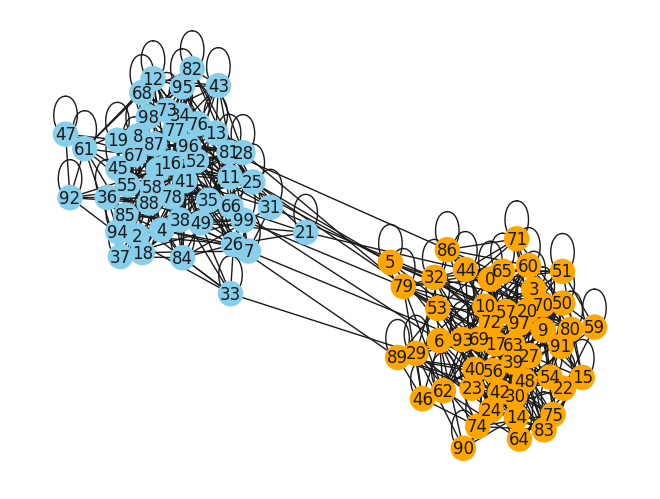

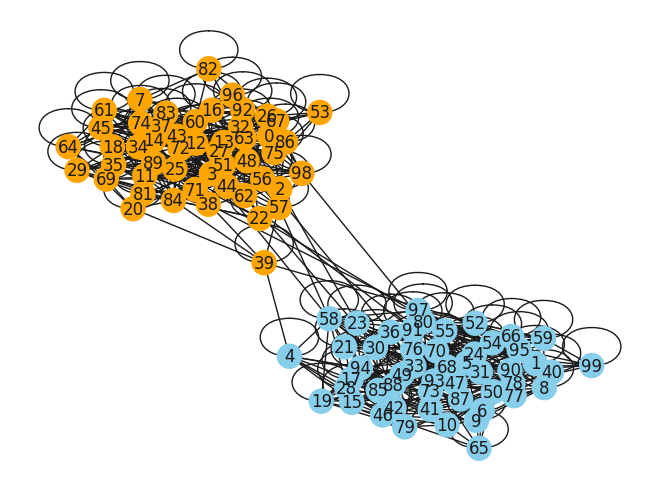

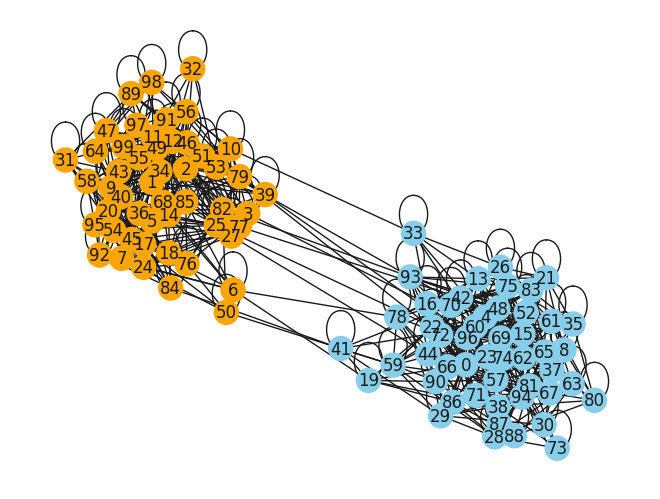

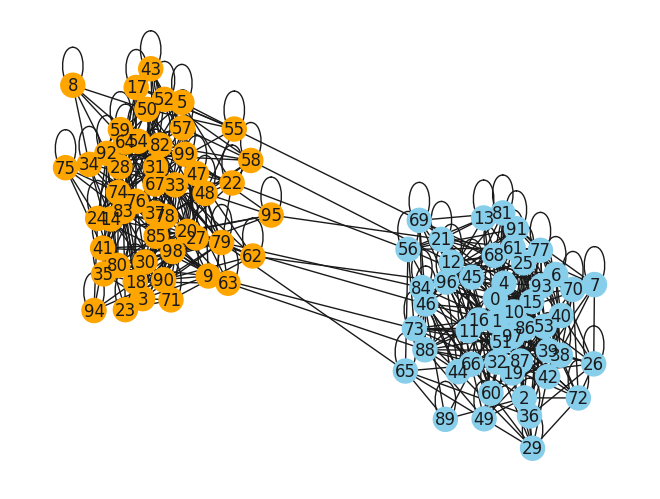

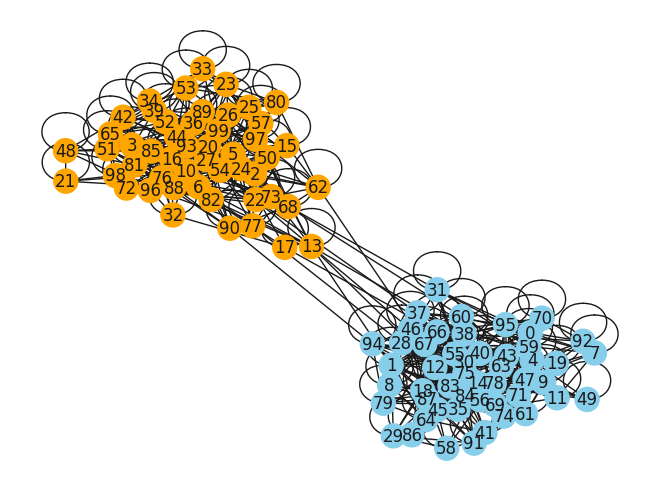

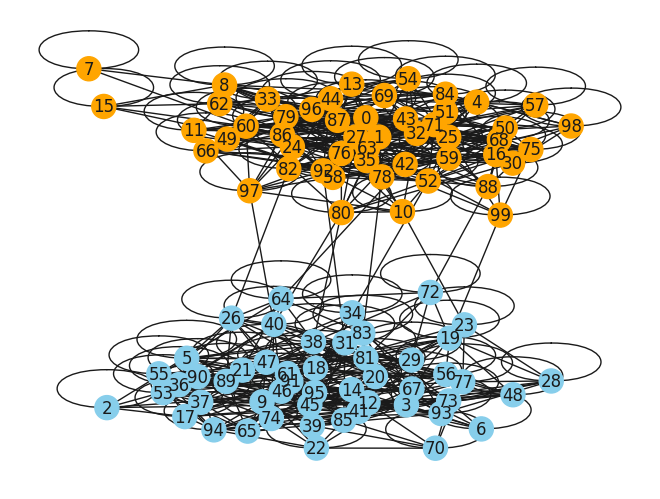

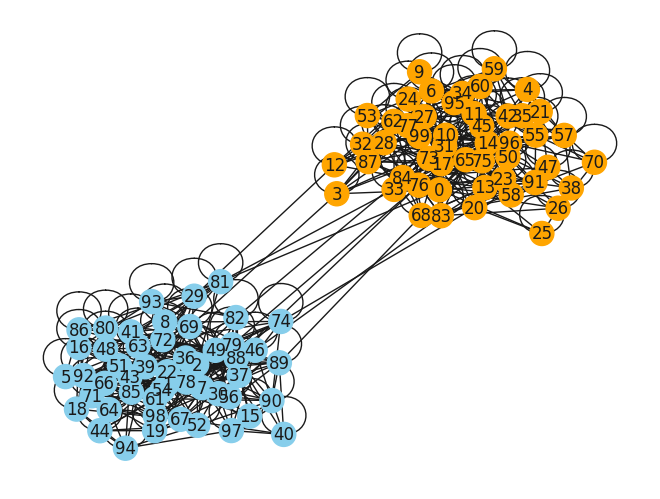

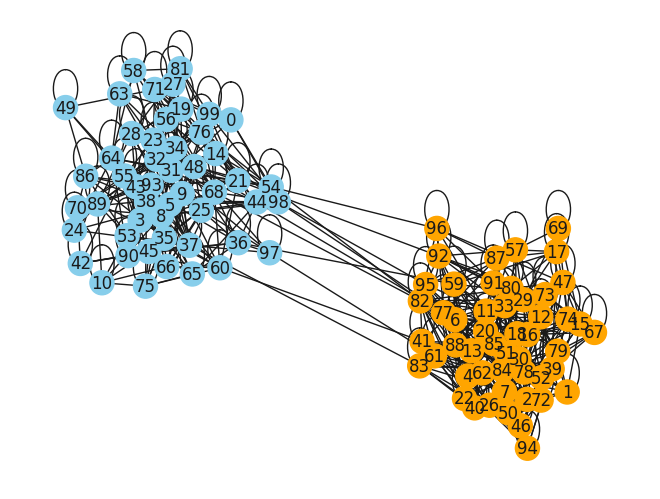

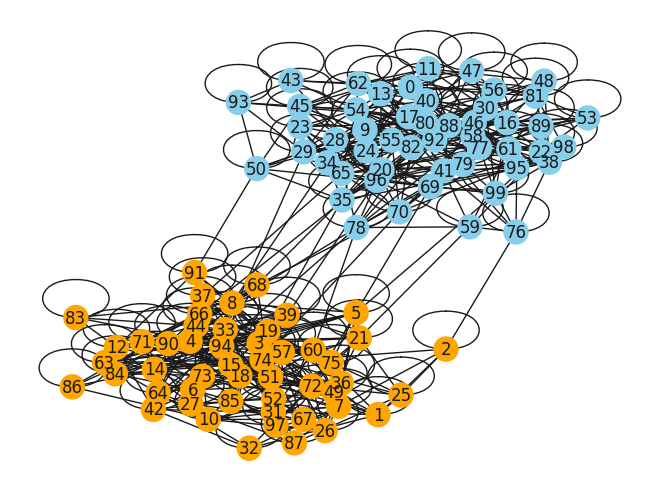

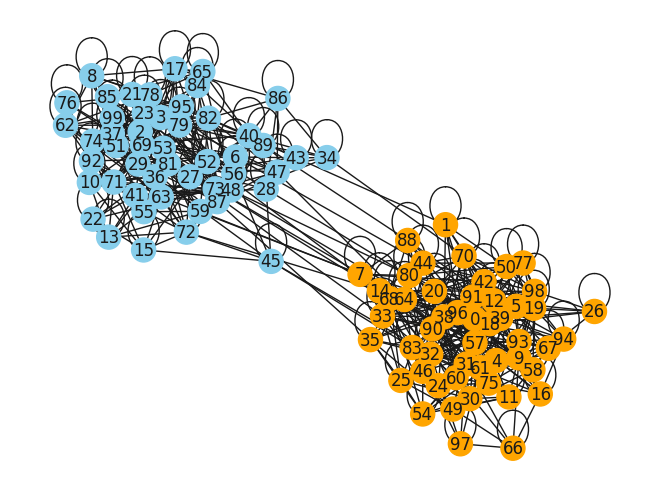

In [38]:
for G in grafos1:
    nxG = nx.from_numpy_array(G.a)
    labels = np.argmax(G.y,axis=1)
    plot_graph(nxG,labels)

Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.8226 - accuracy: 0.4988 - val_loss: 0.7306 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7092 - accuracy: 0.4712 - val_loss: 0.7281 - val_accuracy: 0.5000
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8577 - accuracy: 0.3862 - val_loss: 0.7388 - val_accuracy: 0.5000
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7703 - accuracy: 0.4387 - val_loss: 0.7414 - val_accuracy: 0.5000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6881 - accuracy: 0.5150 - val_loss: 0.7407 - val_accuracy: 0.5000
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7372 - accuracy: 0.5288 - val_loss: 0.7341 - val_accuracy: 0.5000
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7304 - accuracy: 0.4750 - val_loss: 0.7386 - val_accuracy: 0.5000
Epoch 8/200
8/8 [=========

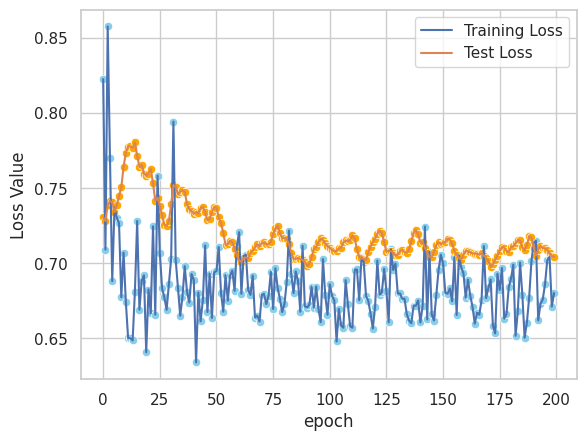

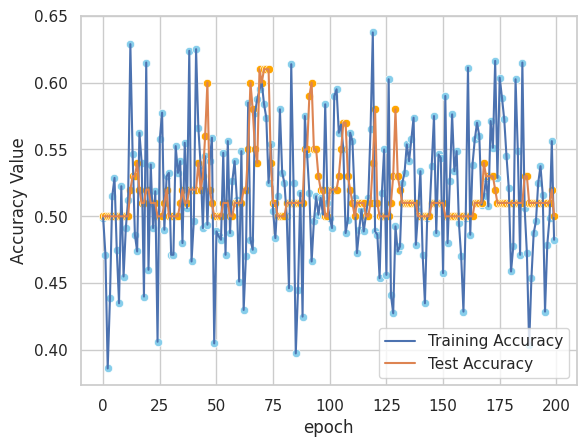

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  32  18      0.68   0.609756     1.0          0.36  0.757576   

   auc_score  
0       0.68  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  33  17  45   5      0.38   0.423077    0.66          0.10  0.515625   
1  50   0  47   3      0.53   0.515464    1.00          0.06  0.680272   
2  50   0  43   7      0.57   0.537634    1.00          0.14  0.699301   
3  49   1  11  39      0.88   0.816667    0.98          0.78  0.890909   
4  28  22  48   2      0.30   0.368421    0.56          0.04  0.444444   
5   2  48  50   0      0.02   0.038462    0.04          0.00  0.039216   
6  49   1   1  49      0.98   0.980000    0.98          0.98  0.980000   
7  50   0  48   2      0.52   0.510

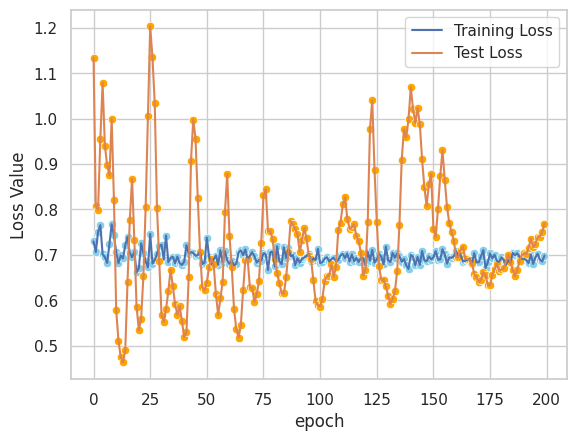

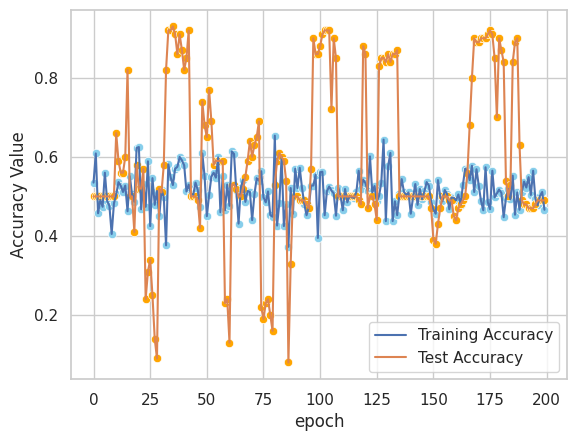

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0   2  48   0  50      0.52        1.0    0.04           1.0  0.076923   

   auc_score  
0       0.52  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   1  49      0.49        0.0     0.0          0.98 NaN       0.49
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0   9  41   0  50      0.59   1.000000    0.18          1.00  0.305085   
1   2  48   0  50      0.52   1.000000    0.04          1.00  0.076923   
2   1  49   0  50      0.51   1.000000    0.02          1.00  0.039216   
3   0  50   2  48      0.48   0.000000    0.00          0.96       NaN   
4   0  50   0  50      0.50        NaN    0.00          1.00       NaN   
5   0  50   0  50      0.50        NaN    0.00          1.00       NaN   
6  10  40   0  50      0.60   1.000000    0.20          1.00  0.333333   
7   6  44   1  49      0.55   0.857143    0.12          0.98  

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)


8/8 [==============================] - 1s 22ms/step - loss: 0.7415 - accuracy: 0.4125 - val_loss: 0.6836 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.9268 - accuracy: 0.4925 - val_loss: 0.6999 - val_accuracy: 0.5000
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7234 - accuracy: 0.4775 - val_loss: 0.6955 - val_accuracy: 0.5100
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7622 - accuracy: 0.5100 - val_loss: 0.6944 - val_accuracy: 0.5000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6827 - accuracy: 0.5000 - val_loss: 0.6816 - val_accuracy: 0.5000
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7048 - accuracy: 0.5025 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7144 - accuracy: 0.5063 - val_loss: 0.6911 - val_accuracy: 0.5000
Epoch 8/200
8/8 [=====================

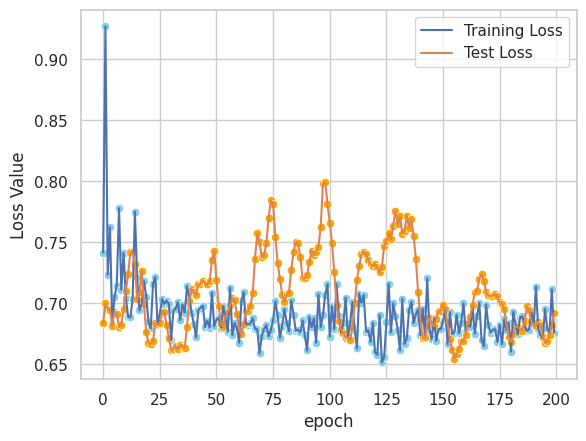

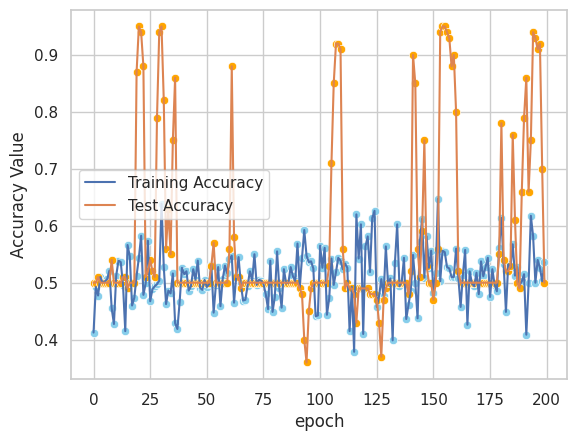

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  27  23      0.72   0.644737    0.98          0.46  0.777778   

   auc_score  
0       0.72  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  44   6  44   6       0.5        0.5    0.88          0.12  0.637681   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  29  21      0.71   0.632911    1.00          0.42  0.775194   
1  24  26   2  48      0.72   0.923077    0.48          0.96  0.631579   
2  21  29  27  23      0.44   0.437500    0.42          0.46  0.428571   
3   0  50  33  17      0.17   0.000000    0.00          0.34       NaN   
4  47   3  15  35      0.82   0.758065    0.94          0.70  0.839286   
5  48   2  36  14      0.62   0.571429    0.96          0.28  0.716418   
6  29  21  50   0      0.29   0.367089    0.58          0.00  0.449612   
7  36  14   7  43      0.79   0.837

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


8/8 [==============================] - 1s 22ms/step - loss: 0.8149 - accuracy: 0.5475 - val_loss: 0.7769 - val_accuracy: 0.2900
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8193 - accuracy: 0.5625 - val_loss: 0.7815 - val_accuracy: 0.2800
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8199 - accuracy: 0.5525 - val_loss: 0.7739 - val_accuracy: 0.2700
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.6488 - val_loss: 0.7733 - val_accuracy: 0.3200
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7030 - accuracy: 0.5525 - val_loss: 0.7721 - val_accuracy: 0.3500
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6754 - accuracy: 0.6200 - val_loss: 0.7719 - val_accuracy: 0.3300
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7618 - accuracy: 0.5638 - val_loss: 0.7665 - val_accuracy: 0.3000
Epoch 8/200
8/8 [=====================

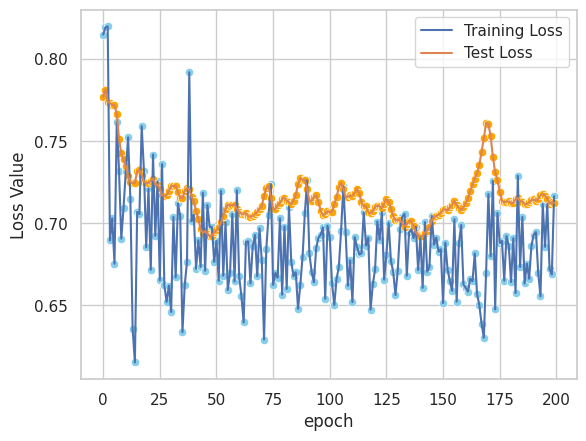

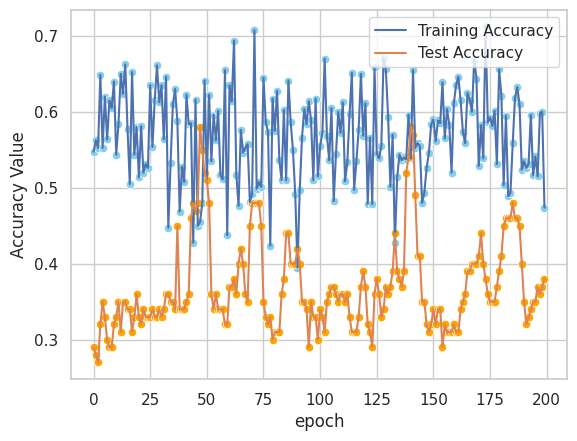

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity       f1  \
0  20  30   1  49      0.69   0.952381     0.4          0.98  0.56338   

   auc_score  
0       0.69  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity       f1  \
0   1  49  13  37      0.38   0.071429    0.02          0.74  0.03125   

   auc_score  
0       0.38  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  43   7   4  46      0.89   0.914894    0.86          0.92  0.886598   
1  43   7  33  17      0.60   0.565789    0.86          0.34  0.682540   
2  47   3  10  40      0.87   0.824561    0.94          0.80  0.878505   
3  23  27   3  47      0.70   0.884615    0.46          0.94  0.605263   
4  47   3   5  45      0.92   0.903846    0.94          0.90  0.921569   
5  12  38   0  50      0.62   1.000000    0.24          1.00  0.387097   
6   0  50  49   1      0.01   0.000000    0.00          0.02       NaN   
7   0  50  16  34      0.34   0.000000 

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


8/8 [==============================] - 1s 23ms/step - loss: 1.1202 - accuracy: 0.4975 - val_loss: 0.6438 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8243 - accuracy: 0.4725 - val_loss: 0.6189 - val_accuracy: 0.5500
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8086 - accuracy: 0.5962 - val_loss: 0.5990 - val_accuracy: 0.8600
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7770 - accuracy: 0.4750 - val_loss: 0.5917 - val_accuracy: 0.9100
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7944 - accuracy: 0.5612 - val_loss: 0.5680 - val_accuracy: 0.9400
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7058 - accuracy: 0.5725 - val_loss: 0.5522 - val_accuracy: 0.9400
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.5987 - val_loss: 0.5412 - val_accuracy: 0.9500
Epoch 8/200
8/8 [=====================

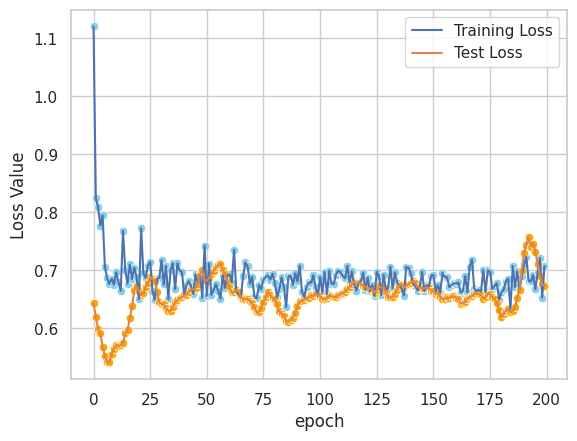

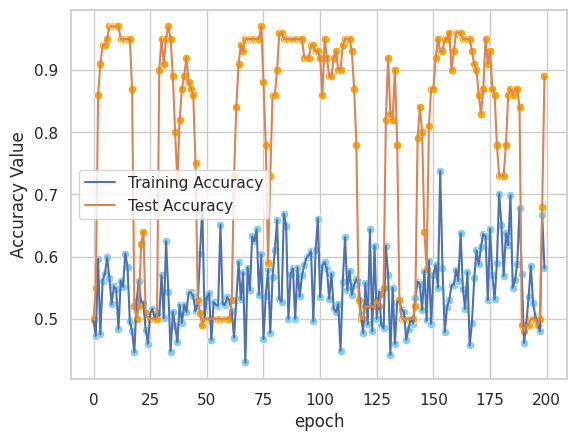

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50  29  21      0.21        0.0     0.0          0.42 NaN       0.21
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  43   7   4  46      0.89   0.914894    0.86          0.92  0.886598   

   auc_score  
0       0.89  
train


<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  27  23   2  48      0.75   0.931034    0.54          0.96  0.683544   
1   1  49  50   0      0.01   0.019608    0.02          0.00  0.019802   
2  12  38  26  24      0.36   0.315789    0.24          0.48  0.272727   
3  47   3  16  34      0.81   0.746032    0.94          0.68  0.831858   
4  50   0  17  33      0.83   0.746269    1.00          0.66  0.854701   
5  49   1  21  29      0.78   0.700000    0.98          0.58  0.816667   
6  38  12  10  40      0.78   0.791667    0.76          0.80  0.775510   
7  48   2  37  13      0.61   0.564706    0.96          0.26  0.711111   

   auc_score  
0       0.75  
1       0.01  
2       0.36  
3       0.81  
4       0.83  
5       0.78  
6       0.78  
7       0.61  
Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.8056 - accuracy: 0.4225 - val_loss: 0.8547 - val_accuracy: 0.3700
Epoch 2/200
8/8 [==============================] - 0s 5ms/

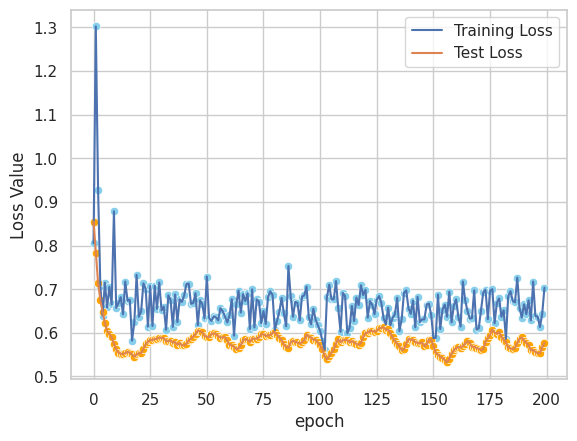

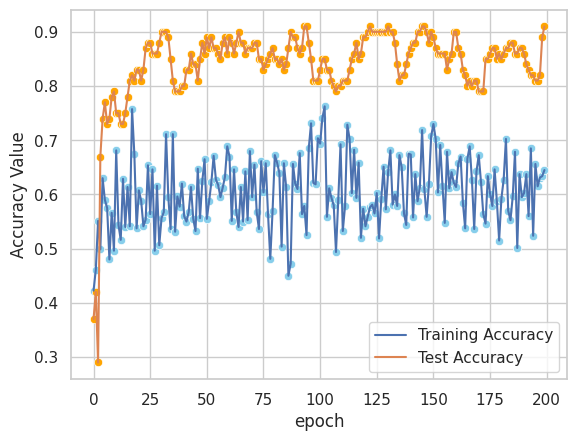

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50  49   1      0.01        0.0     0.0          0.02 NaN       0.01
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  48   2   7  43      0.91   0.872727    0.96          0.86  0.914286   

   auc_score  
0       0.91  
train


<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  47   3  36  14      0.61   0.566265    0.94          0.28  0.706767   
1   3  47  16  34      0.37   0.157895    0.06          0.68  0.086957   
2   0  50  20  30      0.30   0.000000    0.00          0.60       NaN   
3  34  16   9  41      0.75   0.790698    0.68          0.82  0.731183   
4  47   3  14  36      0.83   0.770492    0.94          0.72  0.846847   
5  23  27   0  50      0.73   1.000000    0.46          1.00  0.630137   
6  46   4   4  46      0.92   0.920000    0.92          0.92  0.920000   
7  24  26   1  49      0.73   0.960000    0.48          0.98  0.640000   

   auc_score  
0       0.61  
1       0.37  
2       0.30  
3       0.75  
4       0.83  
5       0.73  
6       0.92  
7       0.73  
Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.7628 - accuracy: 0.5188 - val_loss: 0.8744 - val_accuracy: 0.0000e+00
Epoch 2/200
8/8 [==============================] - 0s 

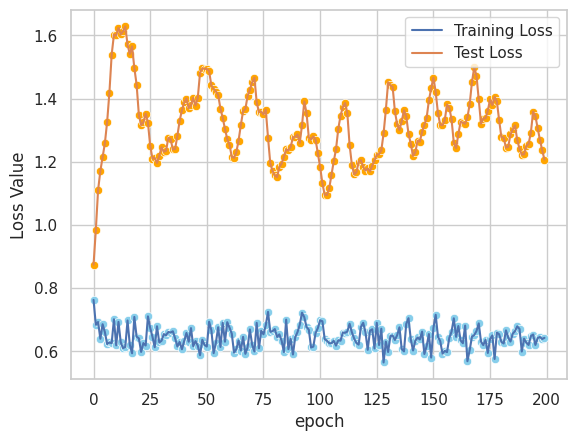

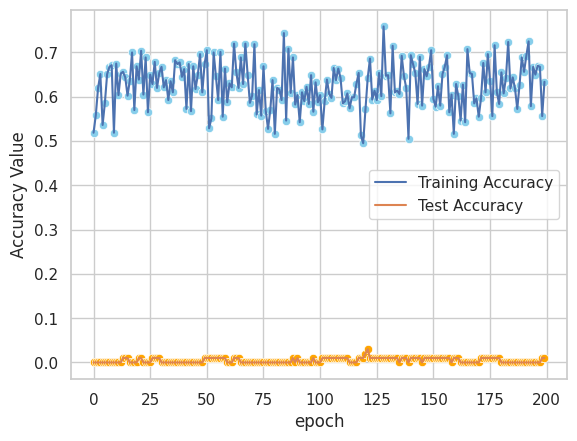

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  33  17  10  40      0.73   0.767442    0.66           0.8  0.709677   

   auc_score  
0       0.73  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50  49   1      0.01        0.0     0.0          0.02 NaN       0.01
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0   4  46  18  32      0.36   0.181818    0.08          0.64  0.111111   
1  22  28   0  50      0.72   1.000000    0.44          1.00  0.611111   
2  45   5   4  46      0.91   0.918367    0.90          0.92  0.909091   
3  48   2   8  42      0.90   0.857143    0.96          0.84  0.905660   
4  25  25   1  49      0.74   0.961538    0.50          0.98  0.657895   
5  47   3  13  37      0.84   0.783333    0.94          0.74  0.854545   
6  47   3  35  15      0.62   0.573171    0.94          0.30  0.712121   
7   0  50  20  30      0.30   0.000000    0.00          0.60  

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


8/8 [==============================] - 1s 22ms/step - loss: 0.9926 - accuracy: 0.5013 - val_loss: 0.6914 - val_accuracy: 0.5400
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.8207 - accuracy: 0.3750 - val_loss: 0.6842 - val_accuracy: 0.5100
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7157 - accuracy: 0.4775 - val_loss: 0.6816 - val_accuracy: 0.5000
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6670 - accuracy: 0.5100 - val_loss: 0.6769 - val_accuracy: 0.5000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7365 - accuracy: 0.4888 - val_loss: 0.6605 - val_accuracy: 0.5200
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6711 - accuracy: 0.5487 - val_loss: 0.6448 - val_accuracy: 0.6300
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7271 - accuracy: 0.5962 - val_loss: 0.6280 - val_accuracy: 0.7300
Epoch 8/200
8/8 [=====================

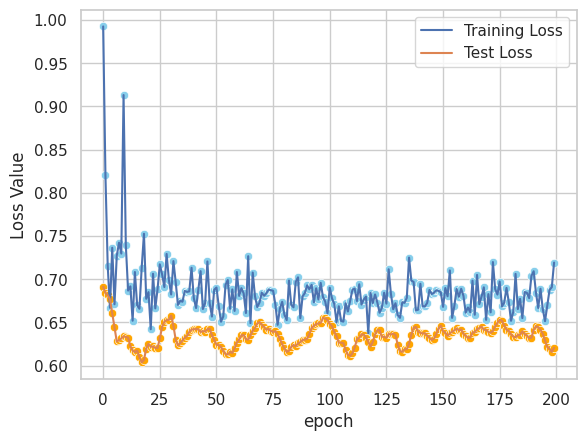

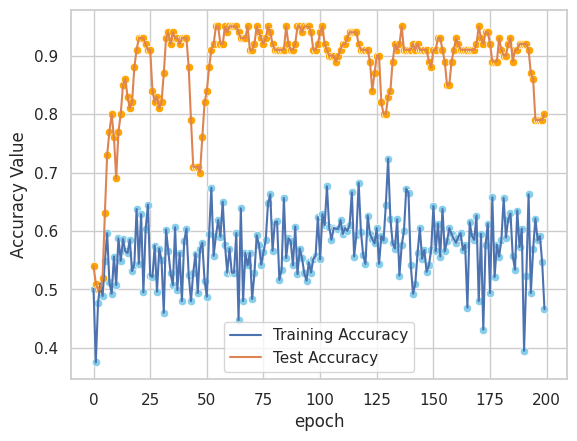

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  17  33  35  15      0.32   0.326923    0.34           0.3  0.333333   

   auc_score  
0       0.32  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  20  30       0.8   0.714286     1.0           0.6  0.833333   

   auc_score  
0        0.8  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  47   3  32  18      0.65   0.594937    0.94          0.36  0.728682   
1  42   8   2  48      0.90   0.954545    0.84          0.96  0.893617   
2  50   0  43   7      0.57   0.537634    1.00          0.14  0.699301   
3  46   4   1  49      0.95   0.978723    0.92          0.98  0.948454   
4   1  49  33  17      0.18   0.029412    0.02          0.34  0.023810   
5  50   0  28  22      0.72   0.641026    1.00          0.44  0.781250   
6  45   5  17  33      0.78   0.725806    0.90          0.66  0.803571   
7   0  50  50   0      0.00   0.000

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


8/8 [==============================] - 1s 21ms/step - loss: 0.7302 - accuracy: 0.5025 - val_loss: 0.7180 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7190 - accuracy: 0.4550 - val_loss: 0.7113 - val_accuracy: 0.5000
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7454 - accuracy: 0.4787 - val_loss: 0.6819 - val_accuracy: 0.4800
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7252 - accuracy: 0.4238 - val_loss: 0.6743 - val_accuracy: 0.8000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7170 - accuracy: 0.4888 - val_loss: 0.6752 - val_accuracy: 0.5400
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7489 - accuracy: 0.5100 - val_loss: 0.6500 - val_accuracy: 0.5000
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7200 - accuracy: 0.4925 - val_loss: 0.6297 - val_accuracy: 0.5300
Epoch 8/200
8/8 [=====================

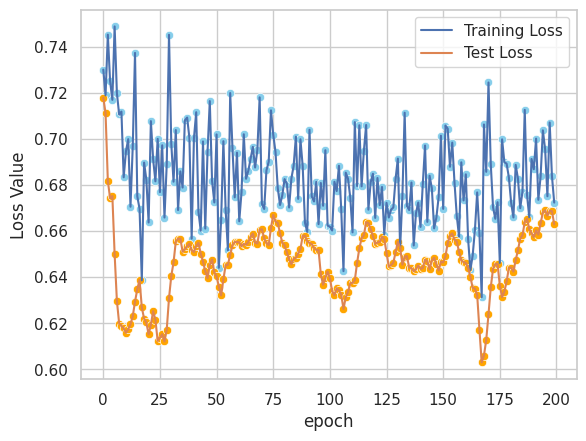

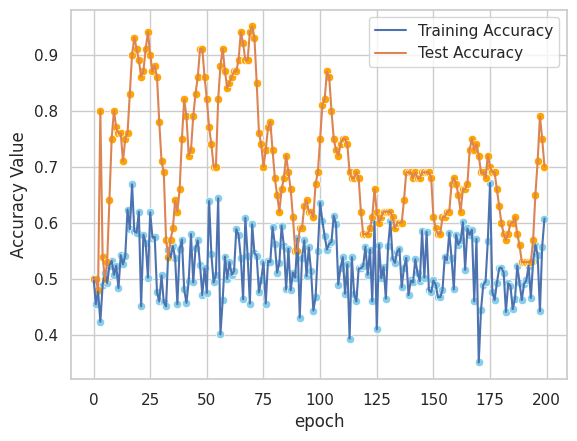

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  49   1      0.51   0.505051     1.0          0.02  0.671141   

   auc_score  
0       0.51  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  30  20       0.7      0.625     1.0           0.4  0.769231   

   auc_score  
0        0.7  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  37  13      0.63   0.574713    1.00          0.26  0.729927   
1   1  49  50   0      0.01   0.019608    0.02          0.00  0.019802   
2  50   0  44   6      0.56   0.531915    1.00          0.12  0.694444   
3  12  38  40  10      0.22   0.230769    0.24          0.20  0.235294   
4  49   1   1  49      0.98   0.980000    0.98          0.98  0.980000   
5  49   1   5  45      0.94   0.907407    0.98          0.90  0.942308   
6  21  29  42   8      0.29   0.333333    0.42          0.16  0.371681   
7  50   0  35  15      0.65   0.588

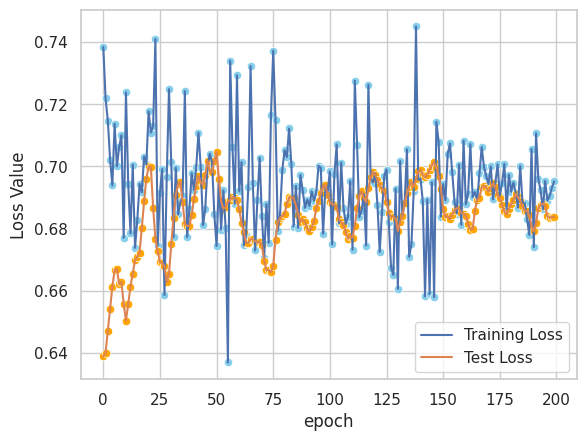

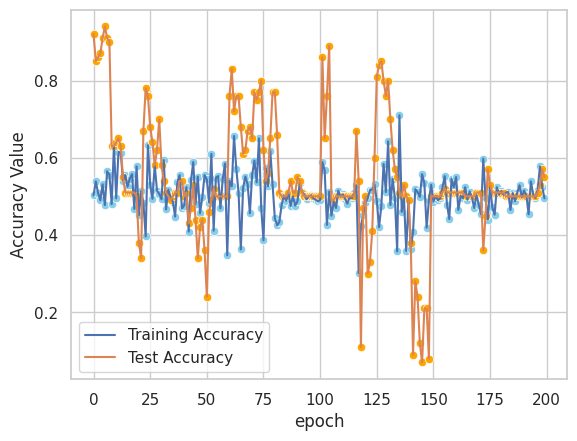

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  47   3   6  44      0.91   0.886792    0.94          0.88  0.912621   

   auc_score  
0       0.91  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0   5  45   0  50      0.55        1.0     0.1           1.0  0.181818   

   auc_score  
0       0.55  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  12  38   0  50      0.62   1.000000    0.24          1.00  0.387097   
1  47   3   4  46      0.93   0.921569    0.94          0.92  0.930693   
2  19  31   0  50      0.69   1.000000    0.38          1.00  0.550725   
3  41   9   3  47      0.88   0.931818    0.82          0.94  0.872340   
4   0  50  47   3      0.03   0.000000    0.00          0.06       NaN   
5   0  50  14  36      0.36   0.000000    0.00          0.72       NaN   
6  14  36  29  21      0.35   0.325581    0.28          0.42  0.301075   
7   0  50   3  47      0.47   0.000

<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)
<ipython-input-23-f23813a28970>:39: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2*precision*recall)/(precision+recall)


In [30]:
aux1 = train_and_test(grafos1, 10)

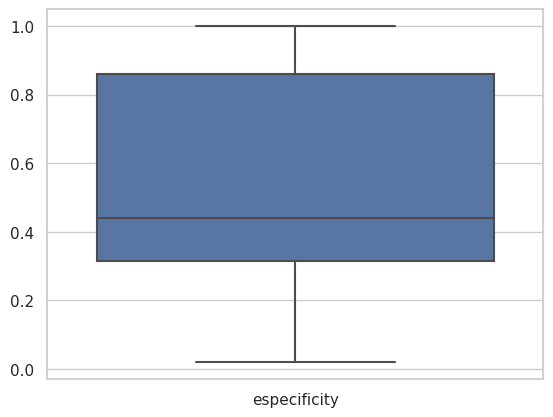

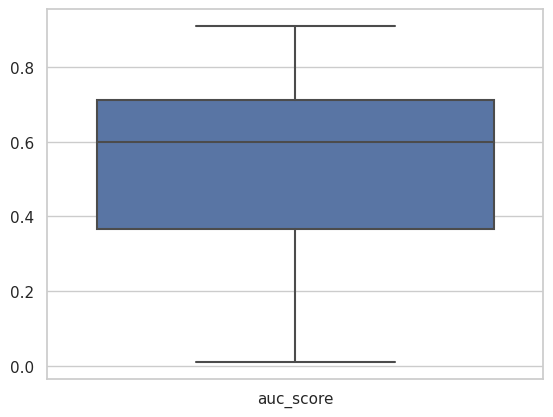

In [31]:
#names = ["test", "val", "train"]        
#for j in range(len(names)):
df1 = aux1[0]["test"]

for i in range(1,10):
    p = aux1[i]["test"]
    df1 = pd.concat([df1, p], ignore_index=True)
    
sns.set_theme(style="whitegrid")
boxplot1 = sns.boxplot(data=df1.iloc[:,7:8]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_especificity_{names[j]}.png'))                             
plt.clf()
    
sns.set_theme(style="whitegrid")
boxplot2 = sns.boxplot(data=df1.iloc[:,9:10]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_auc_{names[j]}.png'))                             
plt.clf()

# Entrenamiento con la versión flattened de los grafos de más arriba

In [33]:
CLASE = eval("Carson_SyntheticGraphs")
FLATTENED = True
SYMMETRIC_ADJACENCY = True
PREPROC_ADJACENCY = True
PREPROC_FEATURES = True

# Se carga el conjunto de grafos
grafos1_flattened = instancia(CLASE, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flatten=FLATTENED, symmetricAdjacency=SYMMETRIC_ADJACENCY,\
                 preprocAdjacency=PREPROC_ADJACENCY, preprocFeatures=PREPROC_FEATURES)


Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.7000 - accuracy: 0.4913 - val_loss: 0.6944 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6898 - accuracy: 0.5600 - val_loss: 0.6939 - val_accuracy: 0.5000
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6941 - accuracy: 0.5000 - val_loss: 0.6940 - val_accuracy: 0.5000
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6965 - accuracy: 0.4775 - val_loss: 0.6938 - val_accuracy: 0.5000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6955 - accuracy: 0.4938 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6956 - accuracy: 0.4762 - val_loss: 0.6938 - val_accuracy: 0.5000
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6955 - accuracy: 0.4675 - val_loss: 0.6937 - val_accuracy: 0.5000
Epoch 8/200
8/8 [=========

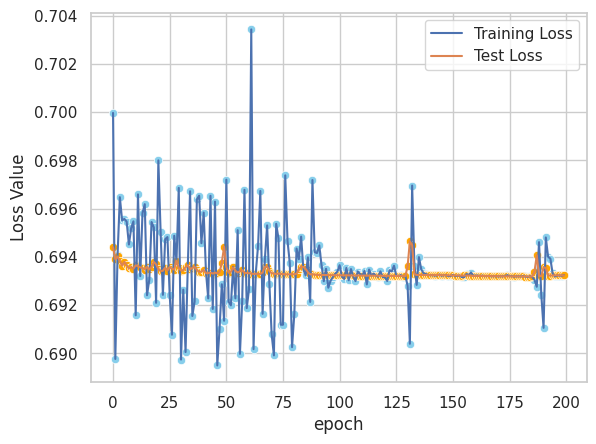

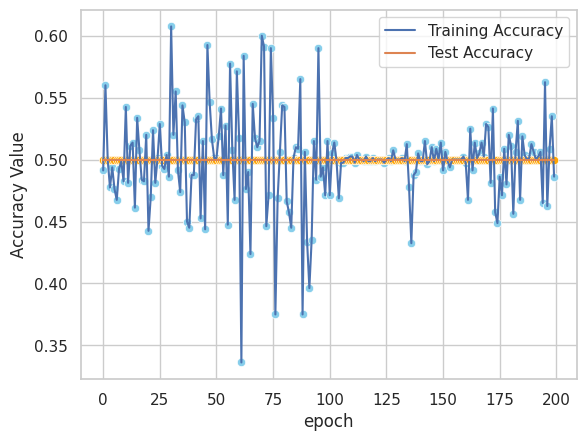

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

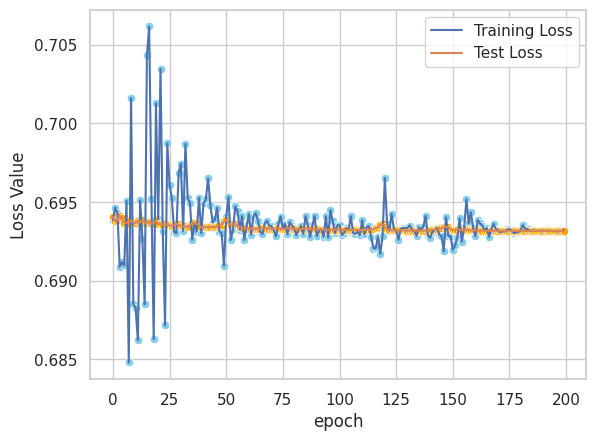

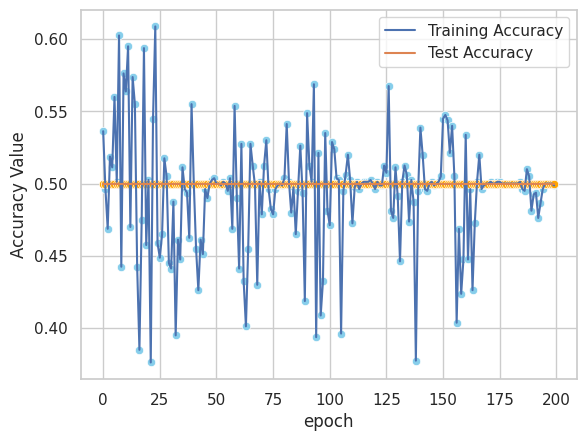

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

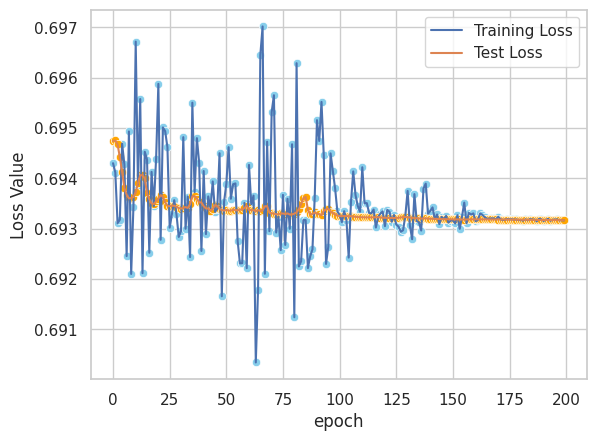

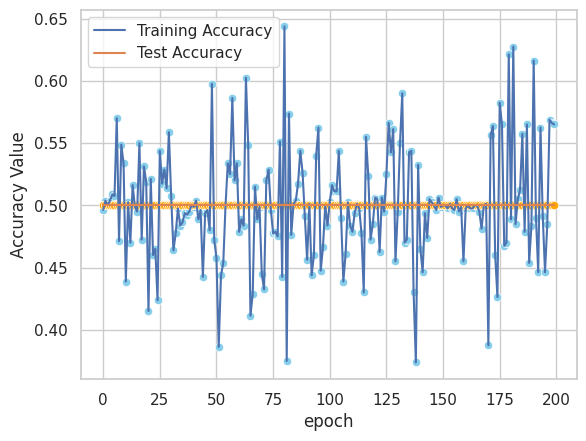

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

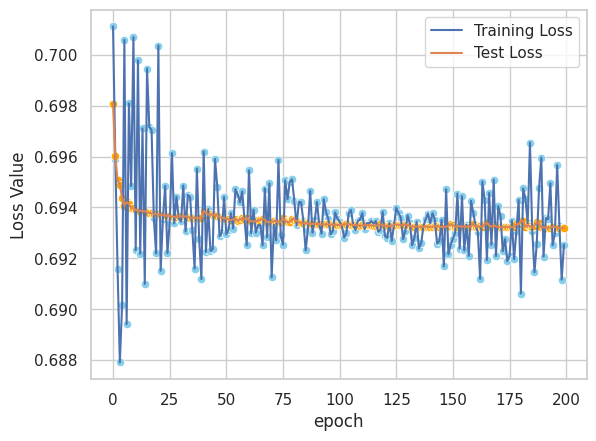

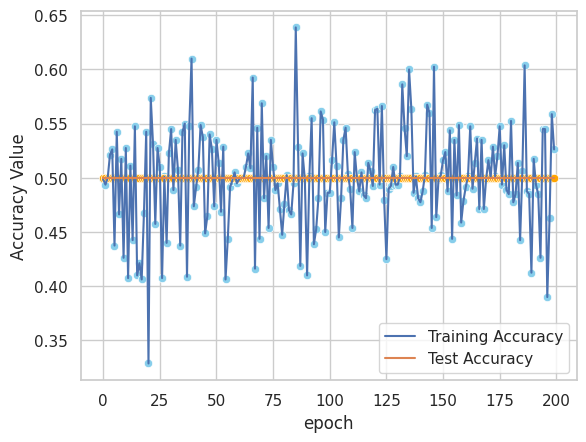

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

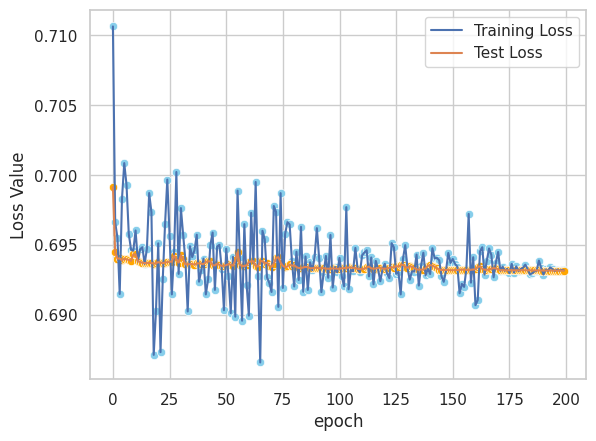

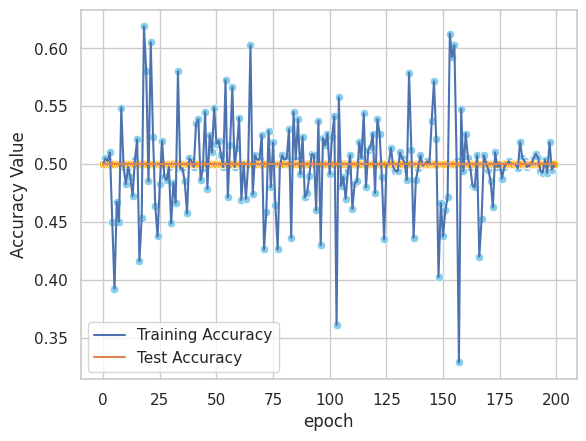

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
train


<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: inva

   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
1   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
2   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
3   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
4   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
5   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
6   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
7   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.6989 - accuracy: 0.4400 - val_loss: 0.6944 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6979 - accuracy: 0.5250 - val_loss: 0.6945 - val_accuracy: 0.5000
Epoch 3/200
8/8 [====================

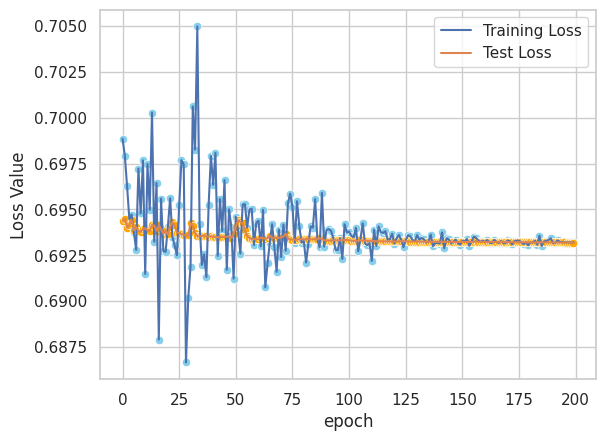

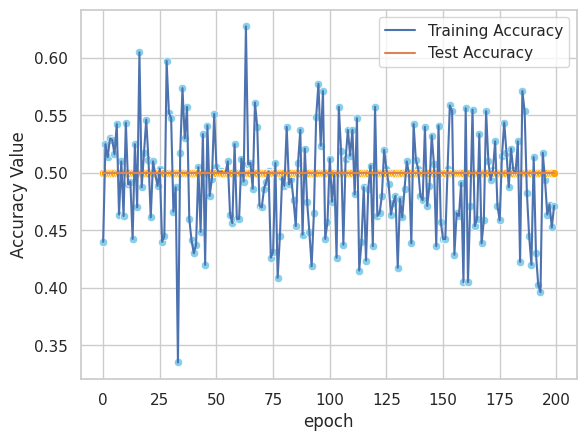

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

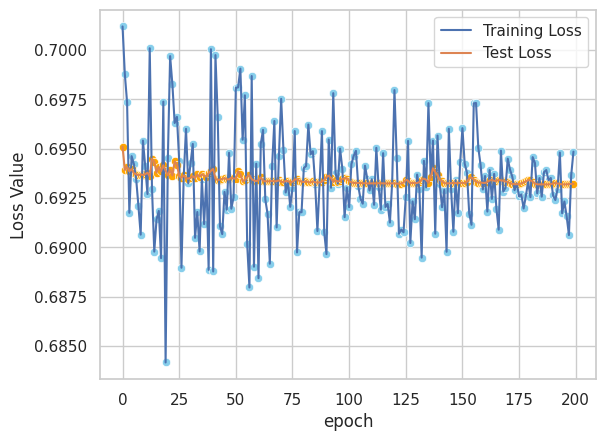

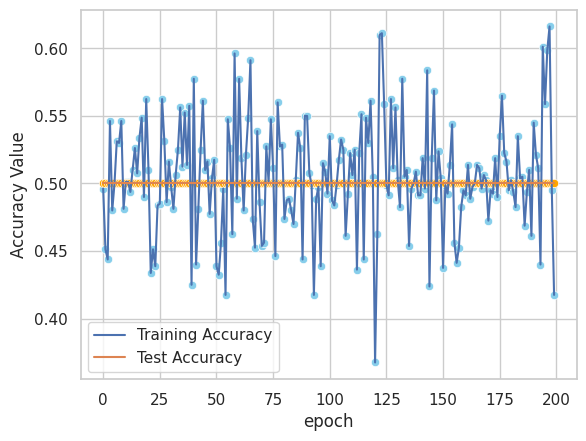

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

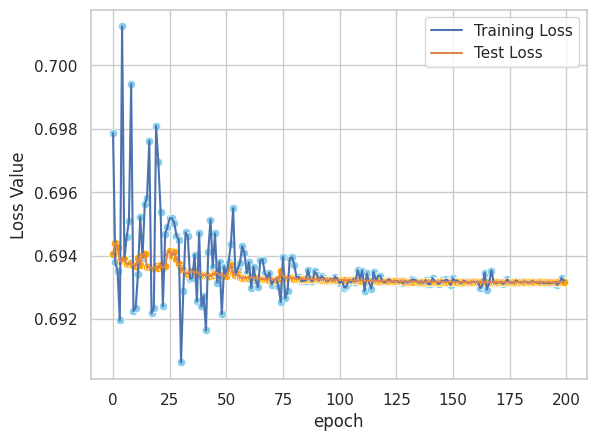

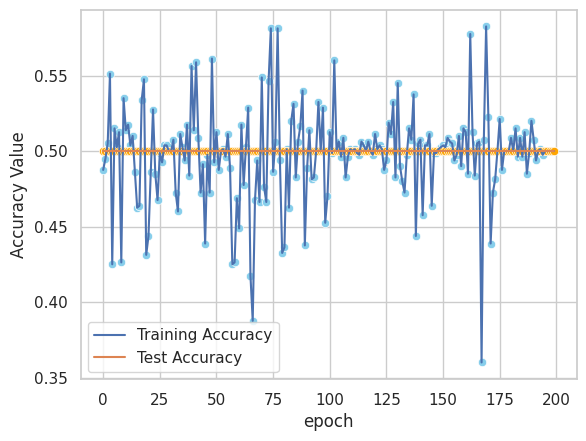

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

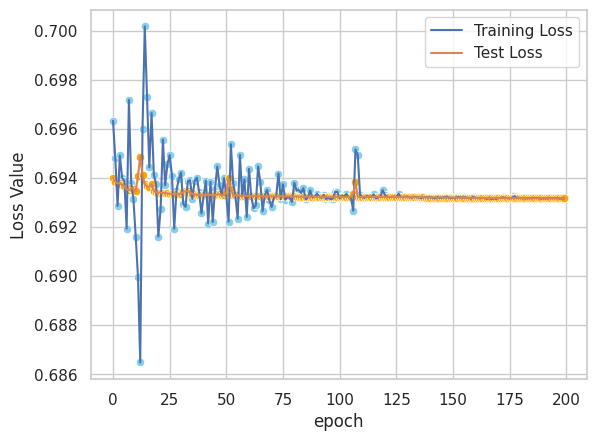

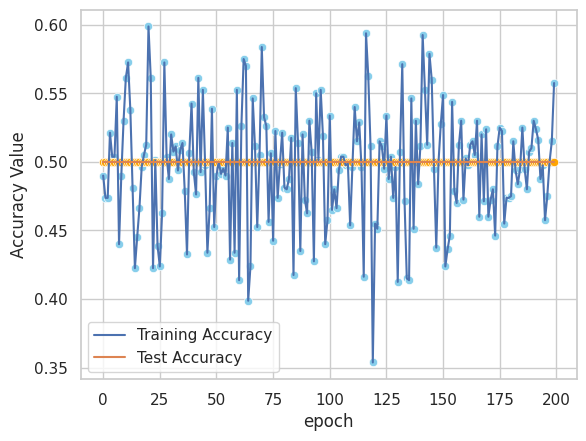

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
train


<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: inva

   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
1   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
2   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
3   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
4   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
5   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
6   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
7   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.6972 - accuracy: 0.4762 - val_loss: 0.6940 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6940 - accuracy: 0.5412 - val_loss: 0.6943 - val_accuracy: 0.5000
Epoch 3/200
8/8 [====================

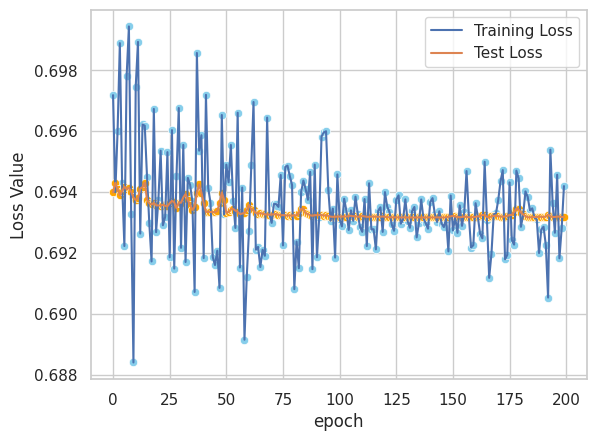

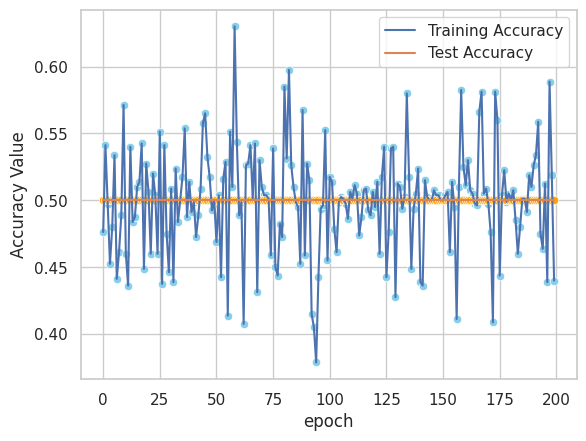

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity  f1  auc_score
0   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
1   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
2   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
3   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
4   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
5   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
6   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0.5
7   0  50   0  50       0.5        NaN     0.0           1.0 NaN        0

<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: invalid value encountered in int_scalars
  precision = TP/(TP+FP)
<ipython-input-23-f23813a28970>:36: RuntimeWarning: inva

In [34]:
aux1_flattened = train_and_test(grafos1_flattened, 10)
    

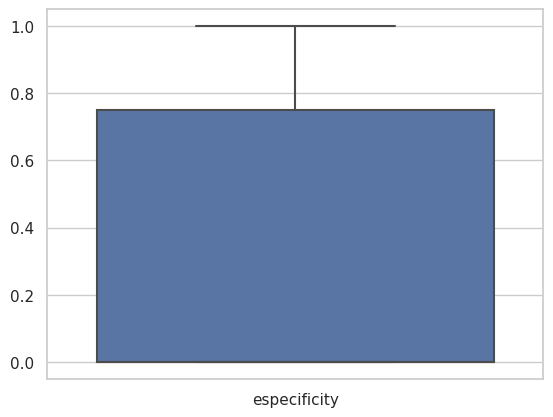

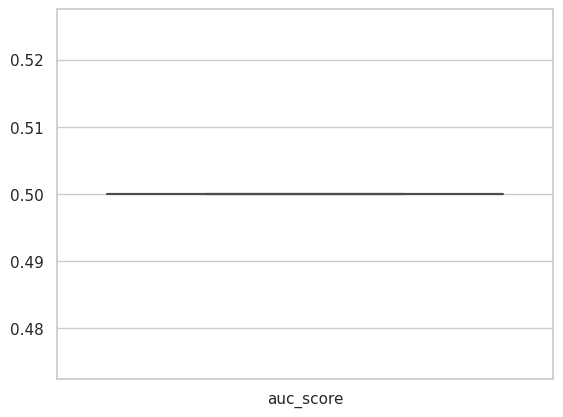

In [35]:
df1_flattened = aux1_flattened[0]["test"]

for i in range(1,10):
    p = aux1_flattened[i]["test"]
    df1_flattened = pd.concat([df1_flattened, p], ignore_index=True)
    
sns.set_theme(style="whitegrid")
boxplot1 = sns.boxplot(data=df1_flattened.iloc[:,7:8]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_especificity_{names[j]}.png'))                             
plt.clf()
    
sns.set_theme(style="whitegrid")
boxplot2 = sns.boxplot(data=df1_flattened.iloc[:,9:10]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_auc_{names[j]}.png'))                             
plt.clf()

# Nuevos grafos y entrenamiento 

In [54]:
avg_degree=10
edge_separation_lambda=2
feature_separation_mu=0.25
num_features=2
num_nodes=100
num_classes=2
num_graphs=10
seed=[123, 234, 345, 456, 567, 679, 789, 321, 654, 987]
community = None
flattened = False

CLASE = eval("Carson_SyntheticGraphs")
SYMMETRIC_ADJACENCY = True
PREPROC_ADJACENCY = True
PREPROC_FEATURES = True

# Se carga el conjunto de grafos
grafos2 = instancia(CLASE, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flatten=flattened, symmetricAdjacency=SYMMETRIC_ADJACENCY,\
                 preprocAdjacency=PREPROC_ADJACENCY, preprocFeatures=PREPROC_FEATURES)


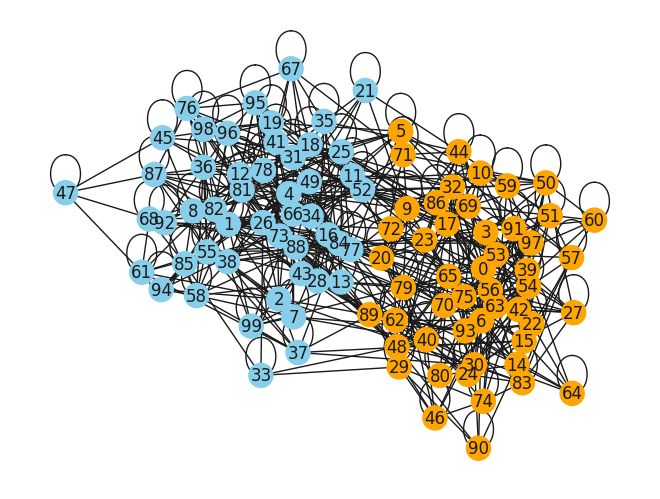

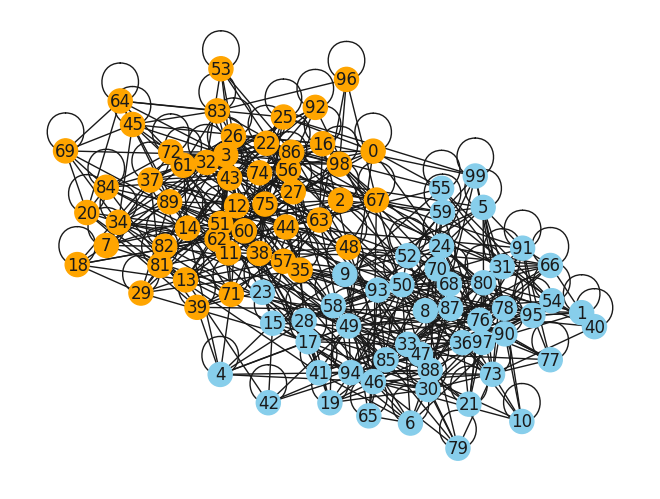

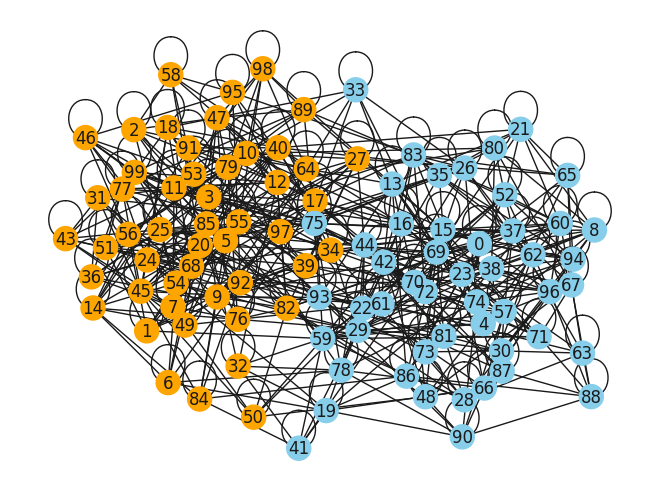

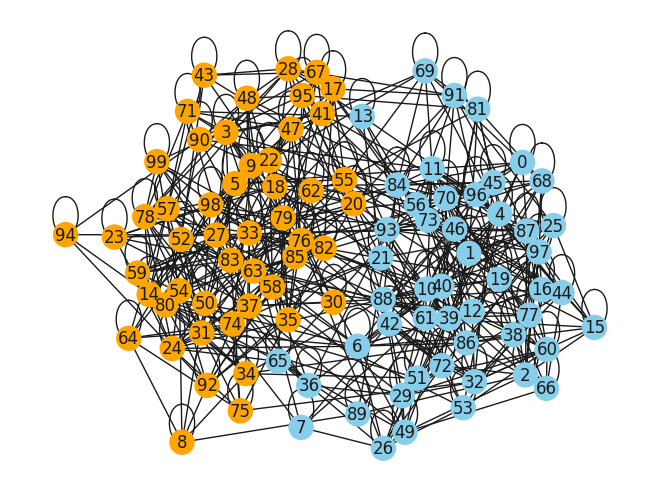

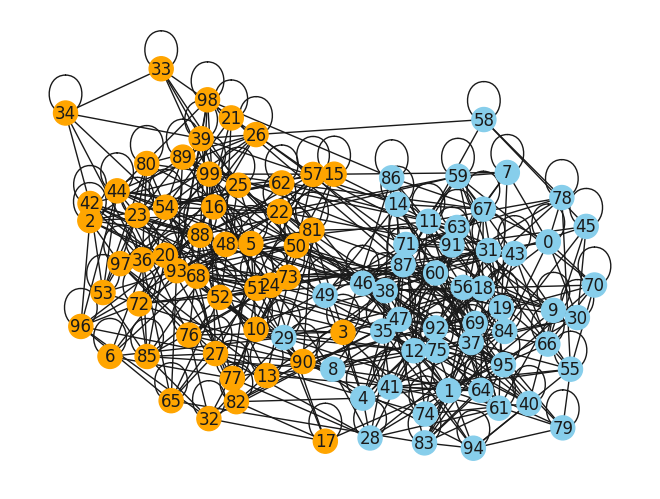

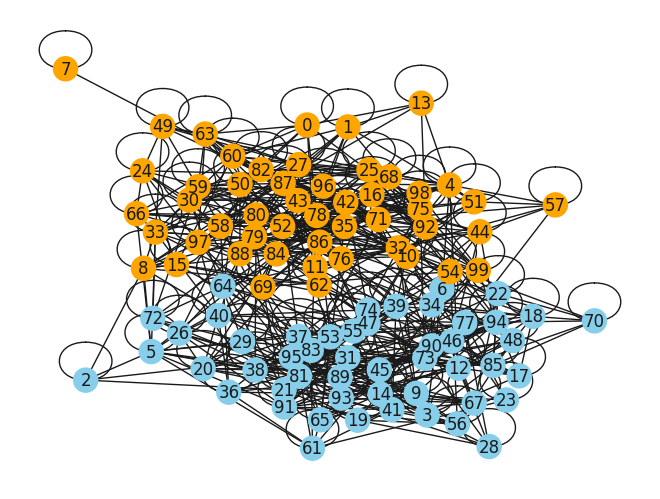

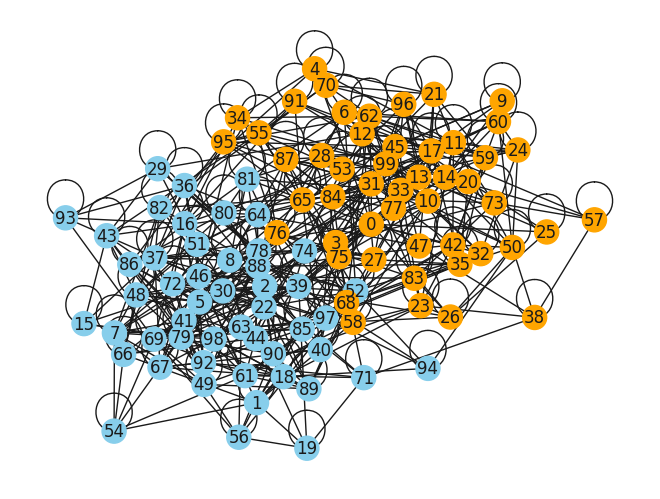

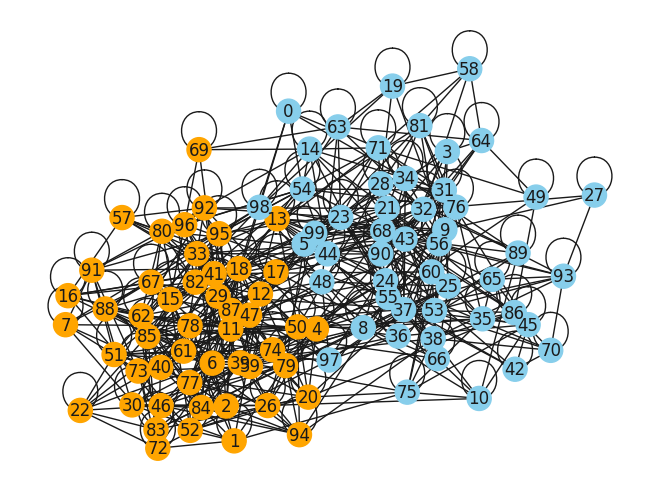

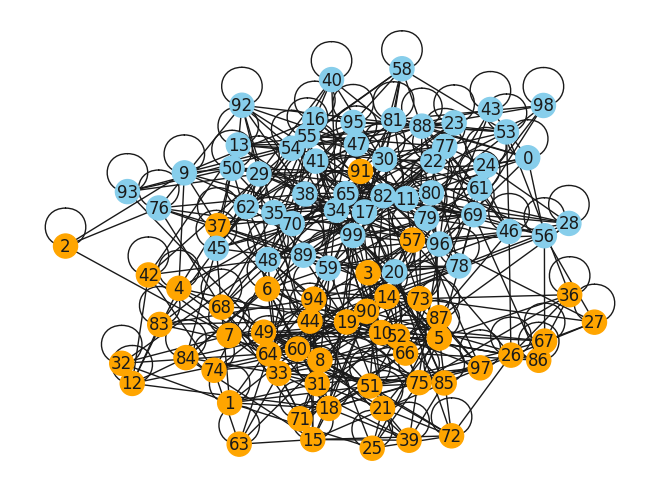

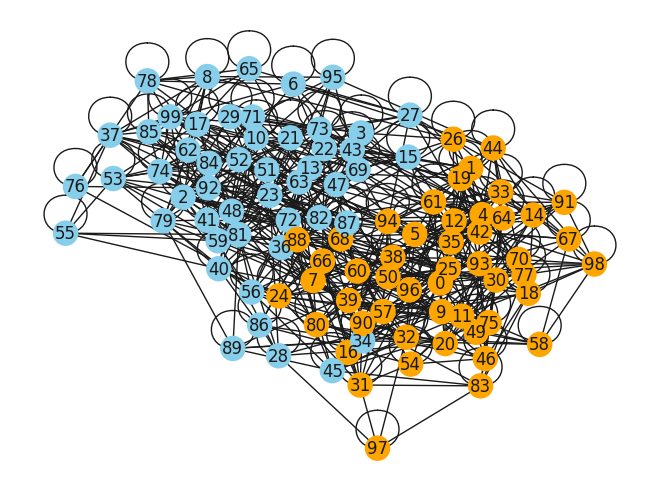

In [55]:
for G in grafos2:
    nxG = nx.from_numpy_array(G.a)
    labels = np.argmax(G.y,axis=1)
    plot_graph(nxG,labels)

Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.7869 - accuracy: 0.5163 - val_loss: 0.8011 - val_accuracy: 0.5000
Epoch 2/200
8/8 [==============================] - 0s 6ms/step - loss: 0.8971 - accuracy: 0.5525 - val_loss: 0.7655 - val_accuracy: 0.4900
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7792 - accuracy: 0.5113 - val_loss: 0.7491 - val_accuracy: 0.4900
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7198 - accuracy: 0.5163 - val_loss: 0.7335 - val_accuracy: 0.4800
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7464 - accuracy: 0.5337 - val_loss: 0.7181 - val_accuracy: 0.4900
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7370 - accuracy: 0.5050 - val_loss: 0.7149 - val_accuracy: 0.4700
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7326 - accuracy: 0.4762 - val_loss: 0.7111 - val_accuracy: 0.4700
Epoch 8/200
8/8 [=========

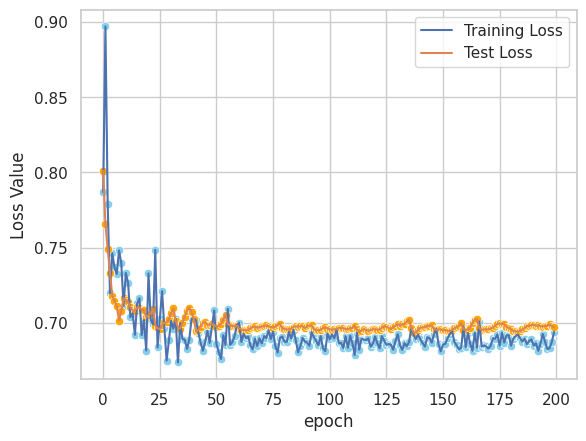

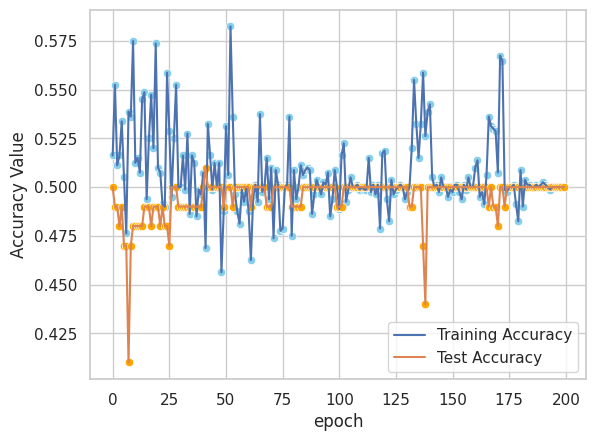

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

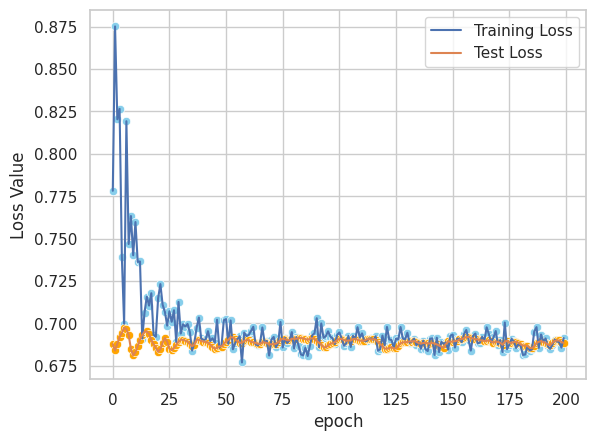

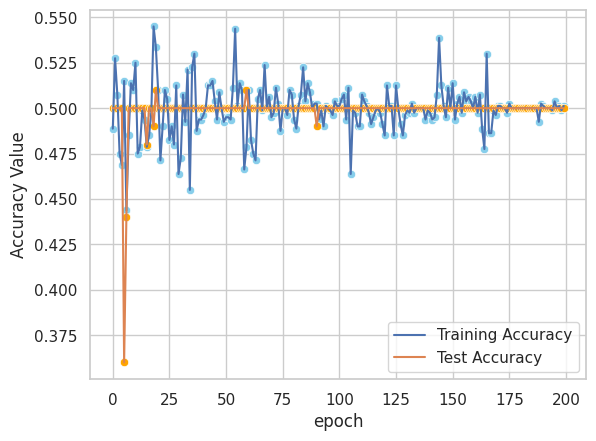

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

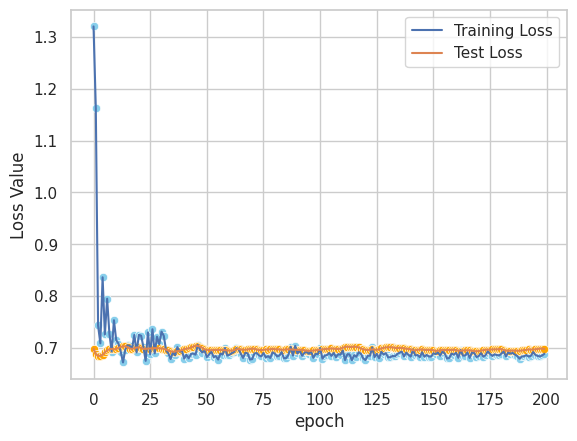

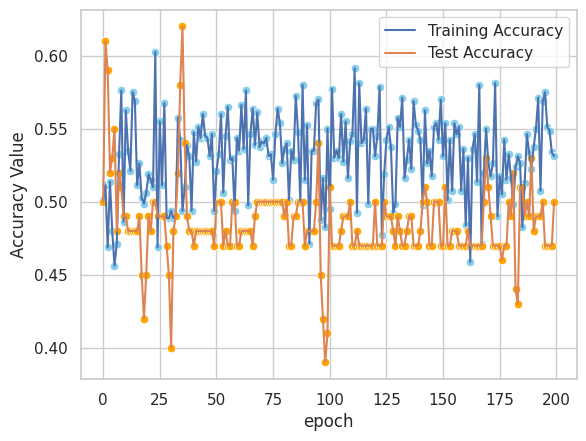

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  18  32  21  29      0.47   0.461538    0.36          0.58  0.404494   

   auc_score  
0       0.47  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0   4  46   4  46       0.5        0.5    0.08          0.92  0.137931   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  17  33   3  47      0.64   0.850000    0.34          0.94  0.485714   
1   1  49   9  41      0.42   0.100000    0.02          0.82  0.033333   
2   2  48   2  48      0.50   0.500000    0.04          0.96  0.074074   
3  35  15  15  35      0.70   0.700000    0.70          0.70  0.700000   
4  46   4  46   4      0.50   0.500000    0.92          0.08  0.647887   
5  48   2  46   4      0.52   0.510638    0.96          0.08  0.666667   
6  22  28  16  34      0.56   0.578947    0.44          0.68  0.500000   
7  41   9  44   6      0.47   0.482

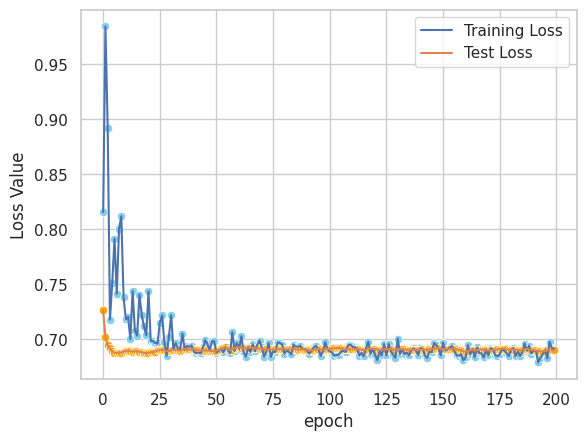

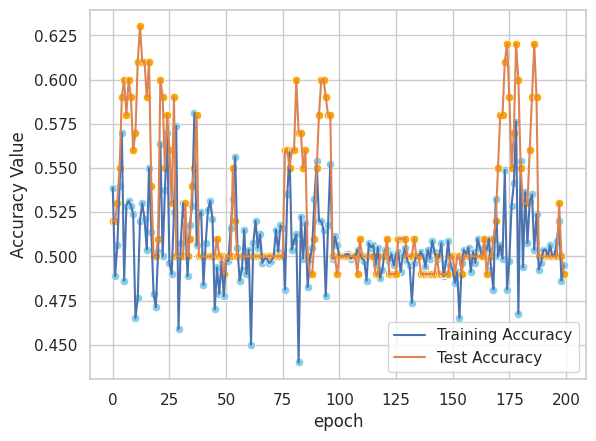

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  50   0      0.49   0.494949    0.98           0.0  0.657718   

   auc_score  
0       0.49  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  50   0      0.49   0.494949    0.98          0.00  0.657718   
1  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
2  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
3  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
4  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
5  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
6  50   0  49   1      0.51   0.505051    1.00          0.02  0.671141   
7  50   0  50   0      0.50   0.500

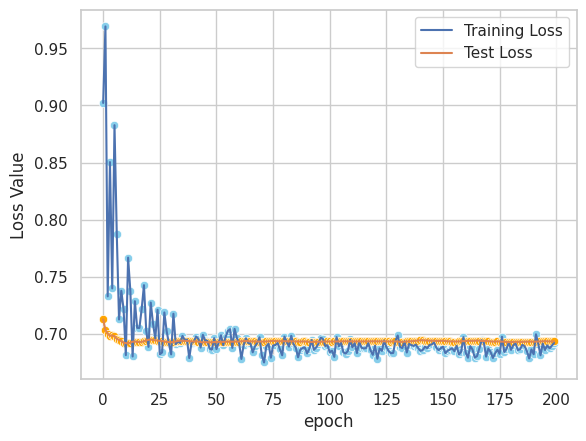

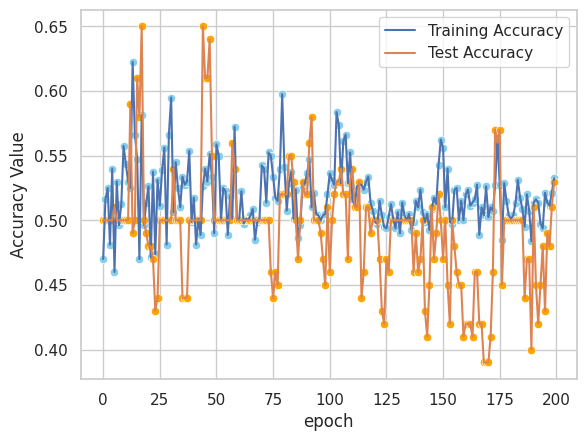

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  18  32  29  21      0.39   0.382979    0.36          0.42  0.371134   

   auc_score  
0       0.39  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity       f1  \
0  21  29  18  32      0.53   0.538462    0.42          0.64  0.47191   

   auc_score  
0       0.53  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  47   3      0.52   0.510417    0.98          0.06  0.671233   
1  49   1  50   0      0.49   0.494949    0.98          0.00  0.657718   
2  16  34  10  40      0.56   0.615385    0.32          0.80  0.421053   
3  49   1  48   2      0.51   0.505155    0.98          0.04  0.666667   
4  39  11  23  27      0.66   0.629032    0.78          0.54  0.696429   
5  50   0  32  18      0.68   0.609756    1.00          0.36  0.757576   
6  41   9  33  17      0.58   0.554054    0.82          0.34  0.661290   
7  50   0  50   0      0.50   0.50000

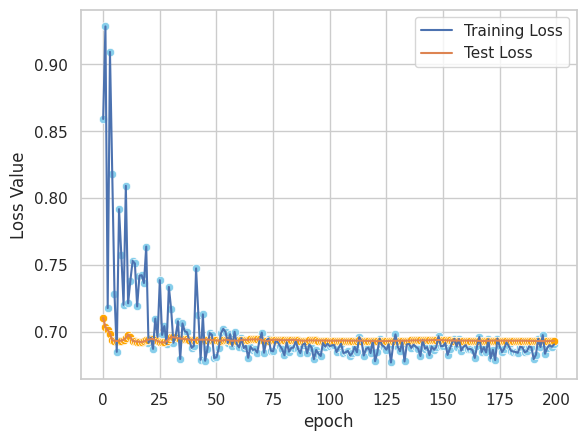

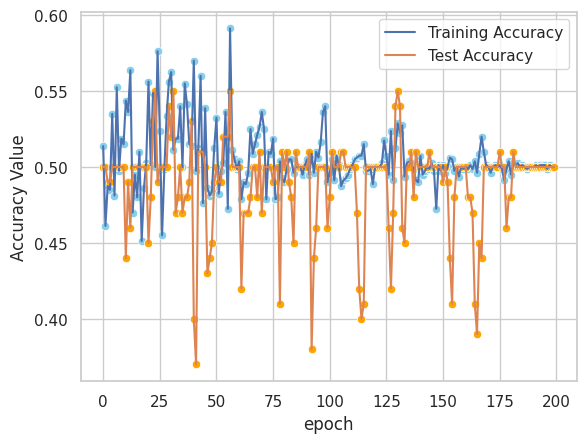

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
1  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
2  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
3  49   1  50   0      0.49   0.494949    0.98           0.0  0.657718   
4  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
5  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
6  50   0  50   0      0.50   0.500000    1.00           0.0  0.666667   
7  50   0  50   0      0.50   0.500

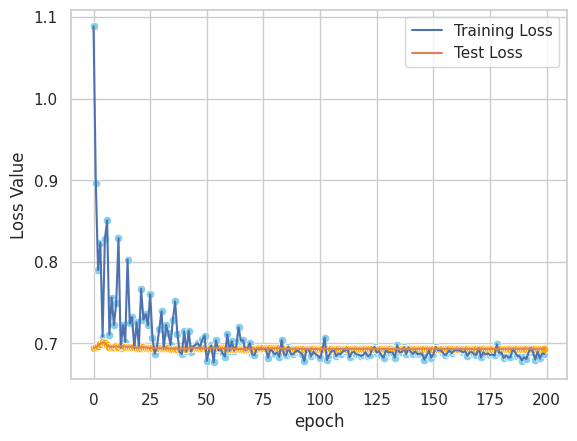

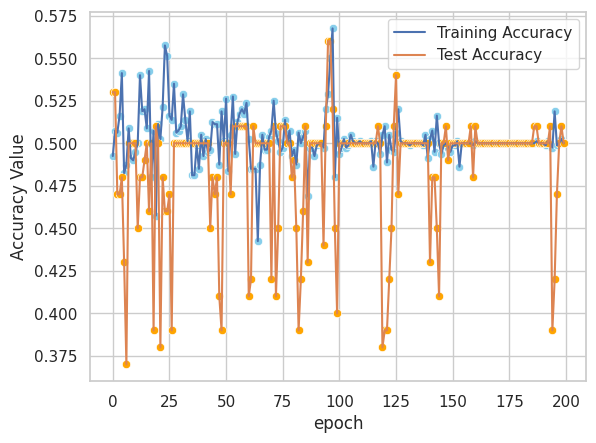

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  49   1      0.51   0.505051     1.0          0.02  0.671141   

   auc_score  
0       0.51  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  49   1       0.5        0.5    0.98          0.02  0.662162   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
1  48   2  50   0      0.48   0.489796    0.96          0.00  0.648649   
2  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
3  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
4  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
5  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
6  49   1  48   2      0.51   0.505155    0.98          0.04  0.666667   
7  50   0  50   0      0.50   0.500

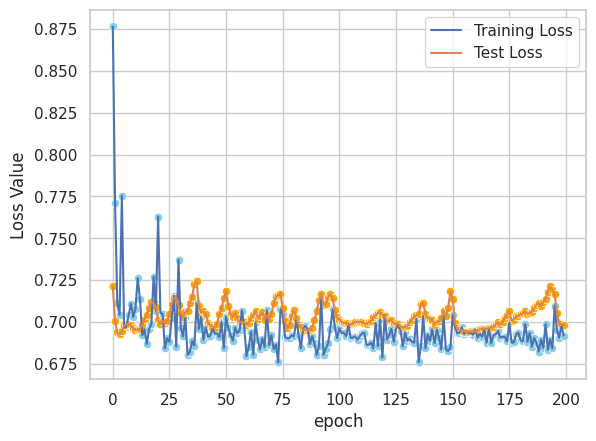

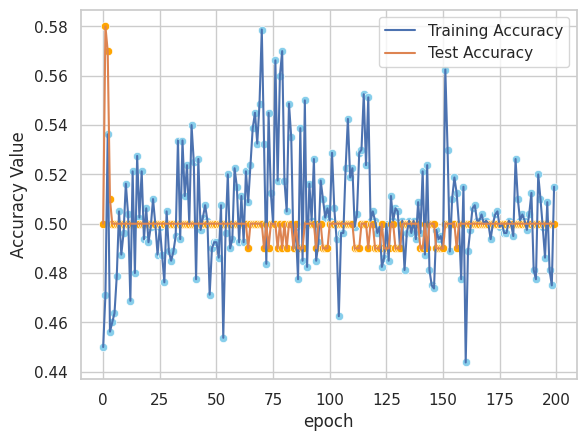

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
1  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
2  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
3  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
4  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
5  50   0  48   2      0.52   0.510204     1.0          0.04  0.675676   
6  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
7  50   0  50   0      0.50   0.500

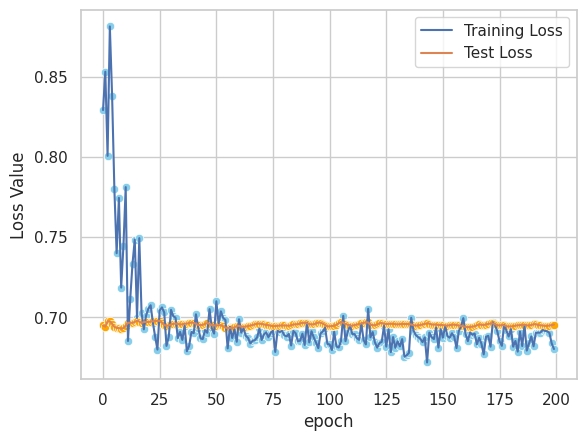

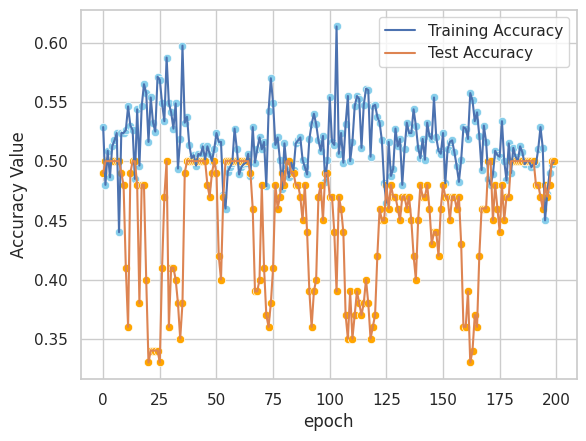

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

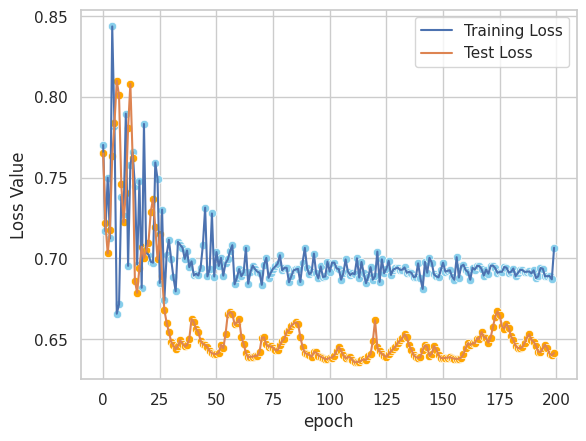

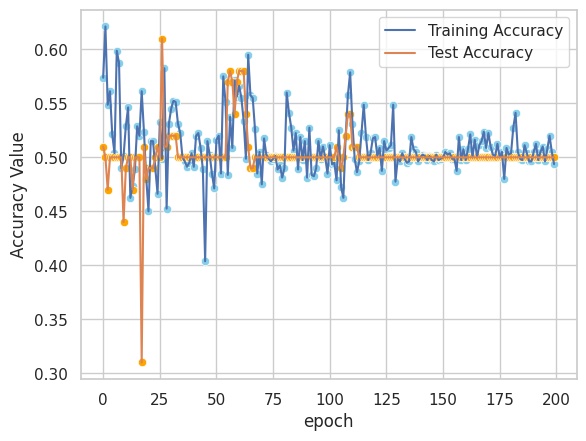

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

In [56]:
aux2 = train_and_test(grafos2, 10)

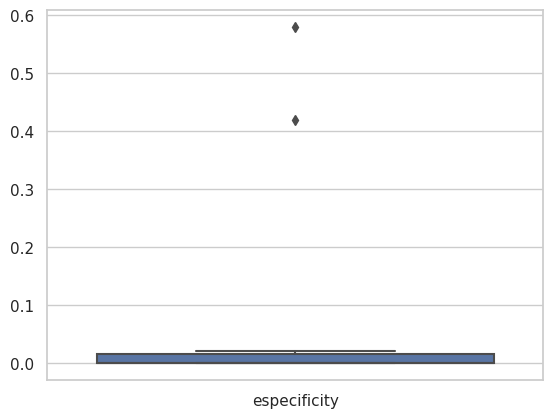

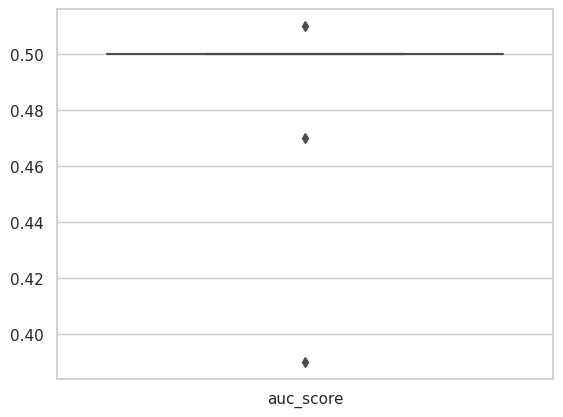

In [57]:
df2 = aux2[0]["test"]

for i in range(1,10):
    p = aux2[i]["test"]
    df2 = pd.concat([df2, p], ignore_index=True)
    
sns.set_theme(style="whitegrid")
boxplot1 = sns.boxplot(data=df2.iloc[:,7:8]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_especificity_{names[j]}.png'))                             
plt.clf()
    
sns.set_theme(style="whitegrid")
boxplot2 = sns.boxplot(data=df2.iloc[:,9:10]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_auc_{names[j]}.png'))                             
plt.clf()

# Nuevo entrenamiento con otros grafos

In [71]:
avg_degree=10
edge_separation_lambda=1
feature_separation_mu=0
num_features=2
num_nodes=100
num_classes=2
num_graphs=10
seed=[123, 234, 345, 456, 567, 679, 789, 321, 654, 987]
community = None
flattened = False

CLASE = eval("Carson_SyntheticGraphs")
SYMMETRIC_ADJACENCY = True
PREPROC_ADJACENCY = True
PREPROC_FEATURES = True

# Se carga el conjunto de grafos
grafos3 = instancia(CLASE, avg_degree, edge_separation_lambda, feature_separation_mu, num_features, num_nodes, \
                 num_classes, num_graphs, seed, community, flatten=flattened, symmetricAdjacency=SYMMETRIC_ADJACENCY,\
                 preprocAdjacency=PREPROC_ADJACENCY, preprocFeatures=PREPROC_FEATURES)


In [70]:
grafos3.delete()

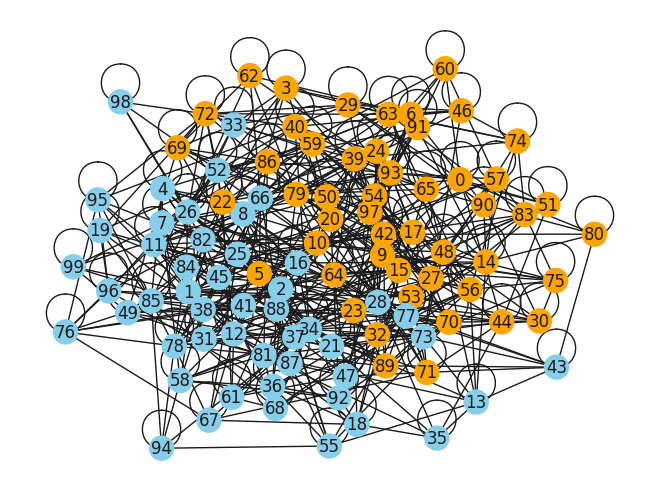

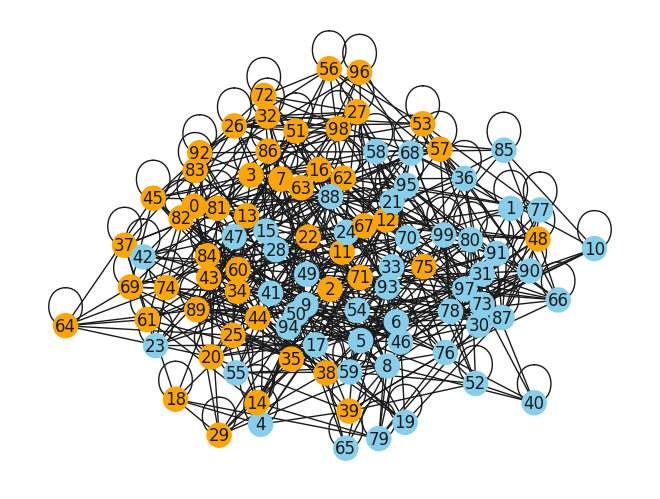

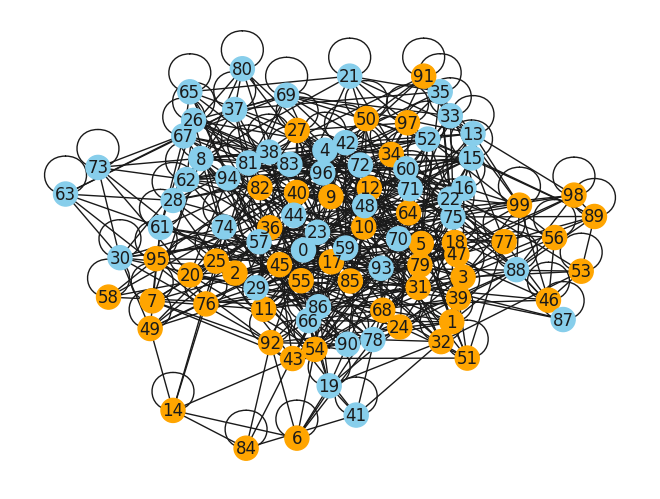

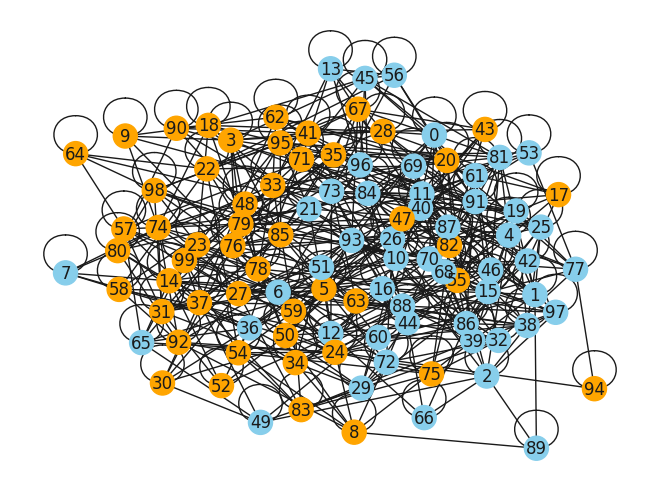

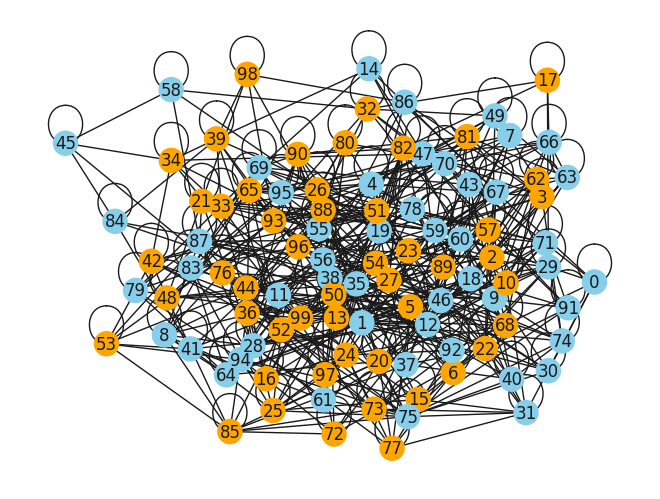

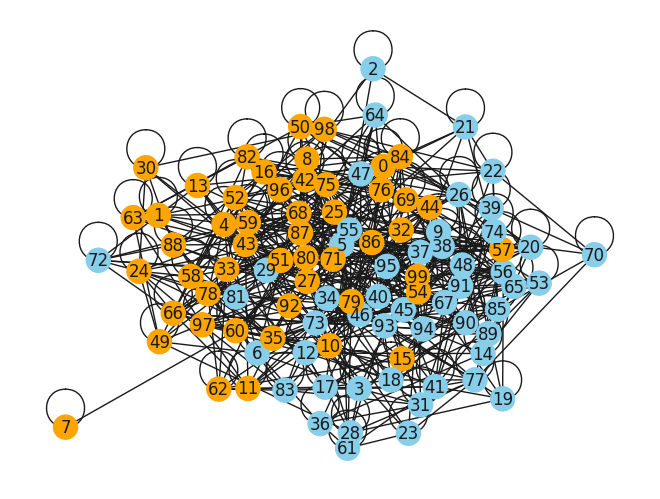

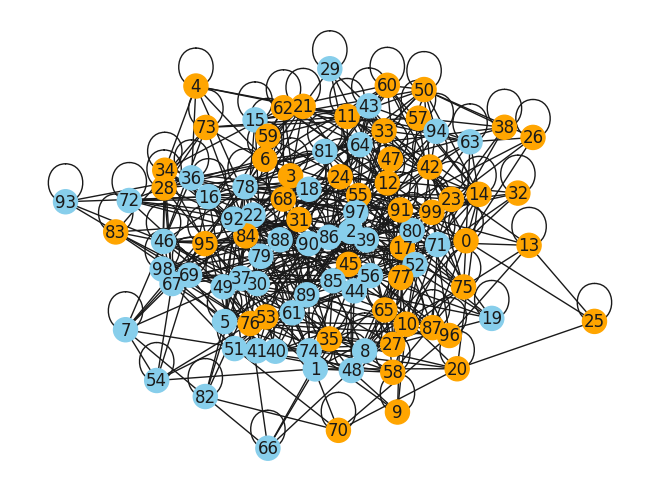

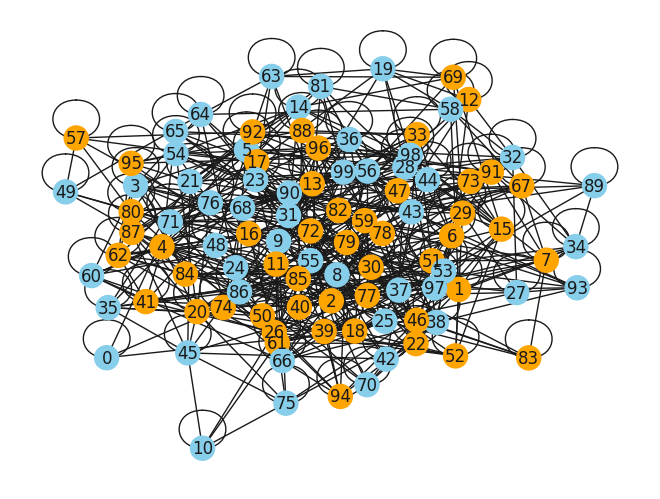

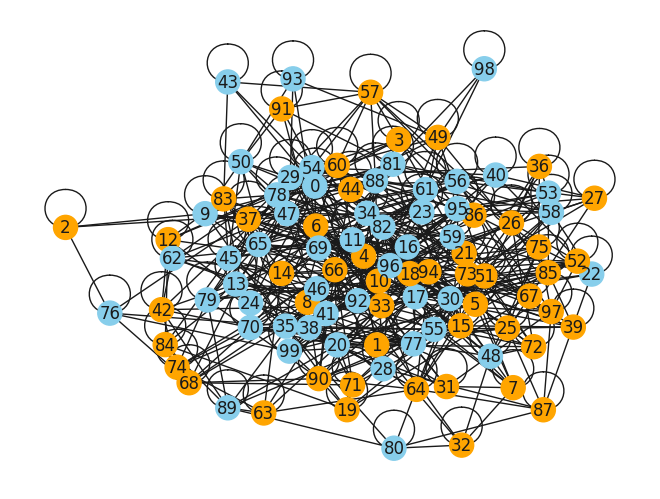

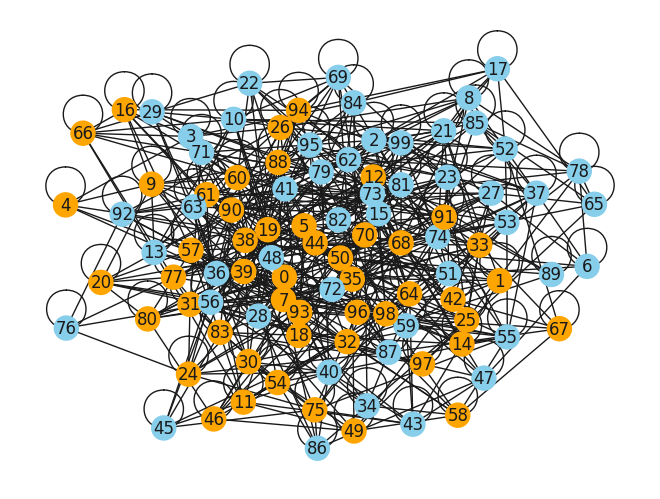

In [72]:
for G in grafos3:
    nxG = nx.from_numpy_array(G.a)
    labels = np.argmax(G.y,axis=1)
    plot_graph(nxG,labels)

Epoch 1/200
8/8 [==============================] - 1s 22ms/step - loss: 0.8297 - accuracy: 0.4938 - val_loss: 2.4539 - val_accuracy: 0.5200
Epoch 2/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7911 - accuracy: 0.4787 - val_loss: 2.2893 - val_accuracy: 0.5200
Epoch 3/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7604 - accuracy: 0.5063 - val_loss: 1.9169 - val_accuracy: 0.5000
Epoch 4/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7301 - accuracy: 0.5038 - val_loss: 1.4863 - val_accuracy: 0.5000
Epoch 5/200
8/8 [==============================] - 0s 5ms/step - loss: 0.7222 - accuracy: 0.5150 - val_loss: 1.1406 - val_accuracy: 0.5000
Epoch 6/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6989 - accuracy: 0.4837 - val_loss: 0.9496 - val_accuracy: 0.5000
Epoch 7/200
8/8 [==============================] - 0s 5ms/step - loss: 0.6951 - accuracy: 0.5088 - val_loss: 0.8266 - val_accuracy: 0.5000
Epoch 8/200
8/8 [=========

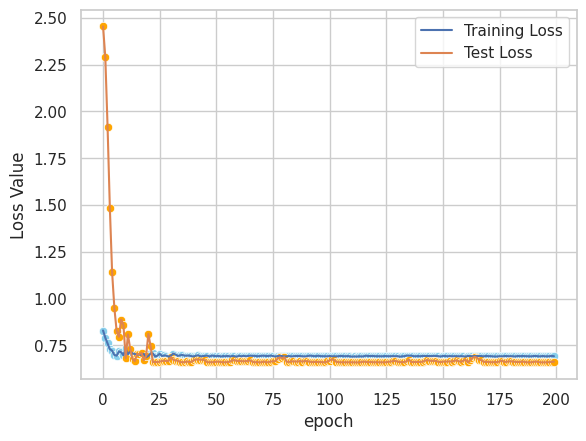

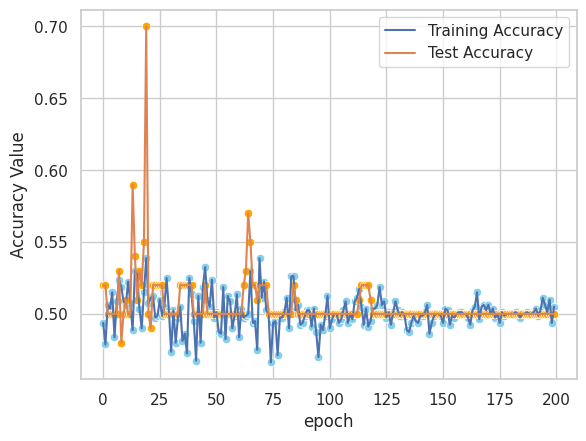

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  47   3      0.53   0.515464     1.0          0.06  0.680272   

   auc_score  
0       0.53  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  49   1  48   2      0.51   0.505155    0.98          0.04  0.666667   
1  49   1  49   1      0.50   0.500000    0.98          0.02  0.662162   
2  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
3  50   0  49   1      0.51   0.505051    1.00          0.02  0.671141   
4  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
5  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
6  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
7  50   0  50   0      0.50   0.500

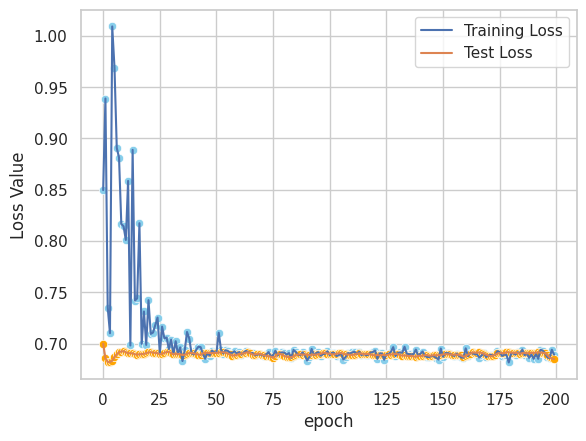

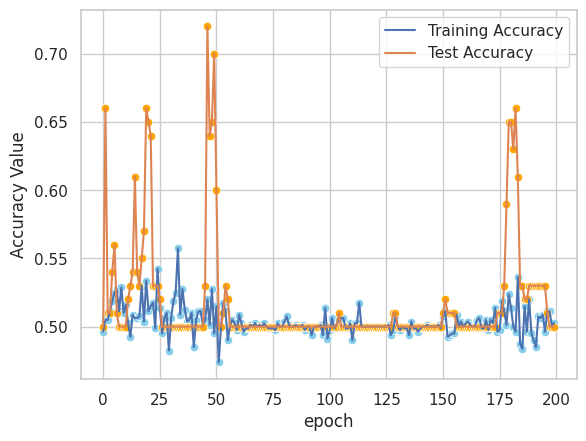

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

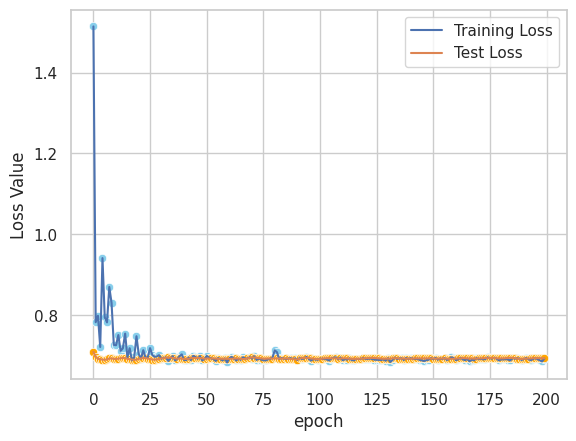

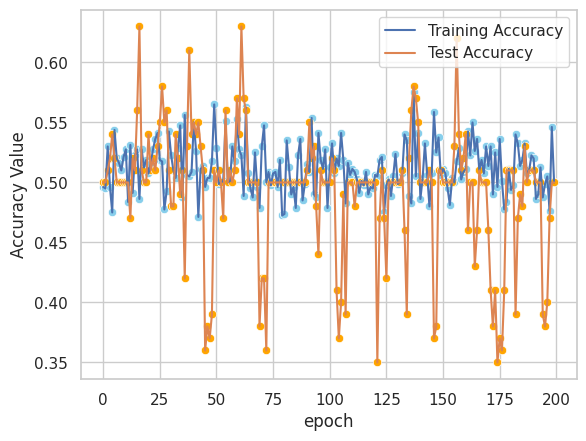

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

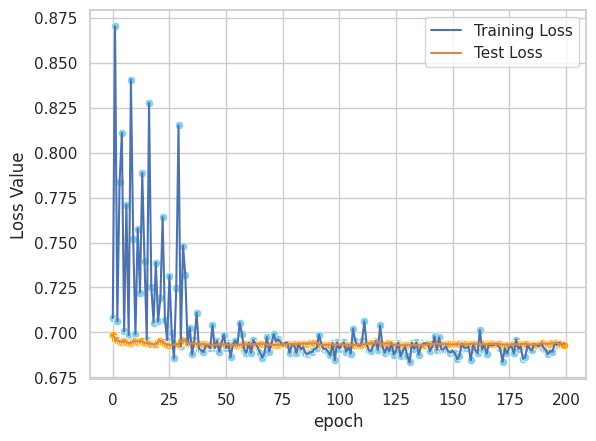

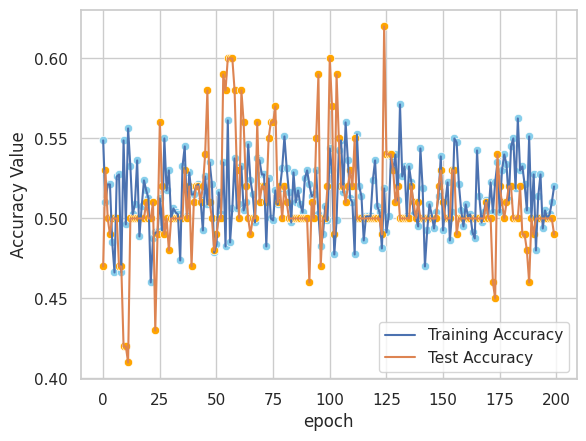

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  44   6  47   3      0.47   0.483516    0.88          0.06  0.624113   

   auc_score  
0       0.47  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  41   9  42   8      0.49   0.493976    0.82          0.16  0.616541   

   auc_score  
0       0.49  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000    1.00          0.00  0.666667   
1  45   5  49   1      0.46   0.478723    0.90          0.02  0.625000   
2  37  13  35  15      0.52   0.513889    0.74          0.30  0.606557   
3  45   5  45   5      0.50   0.500000    0.90          0.10  0.642857   
4  44   6  45   5      0.49   0.494382    0.88          0.10  0.633094   
5  50   0  48   2      0.52   0.510204    1.00          0.04  0.675676   
6  38  12  42   8      0.46   0.475000    0.76          0.16  0.584615   
7  12  38  17  33      0.45   0.413

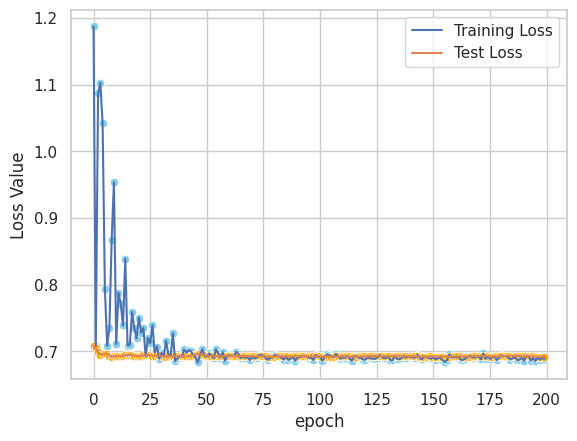

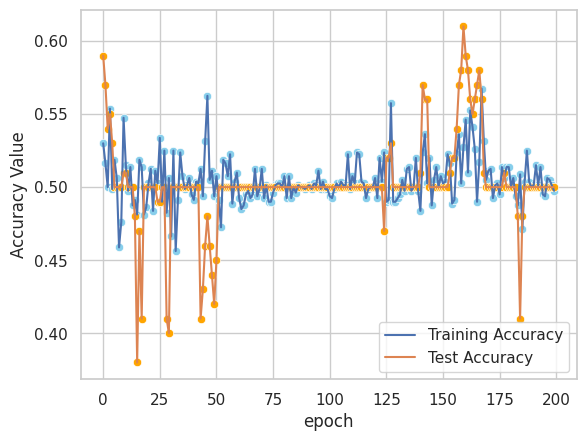

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
1  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
2  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
3  50   0  49   1      0.51   0.505051     1.0          0.02  0.671141   
4  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
5  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
6  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
7  50   0  50   0      0.50   0.500

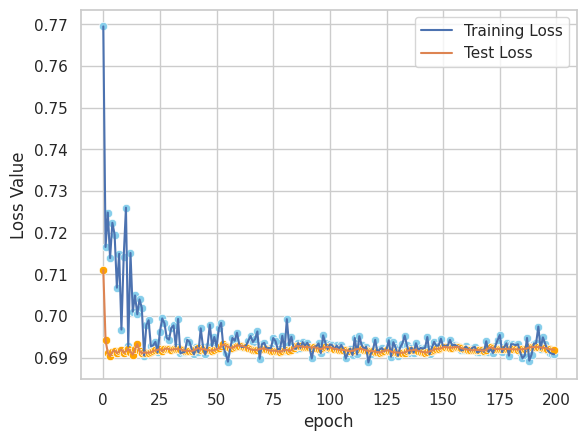

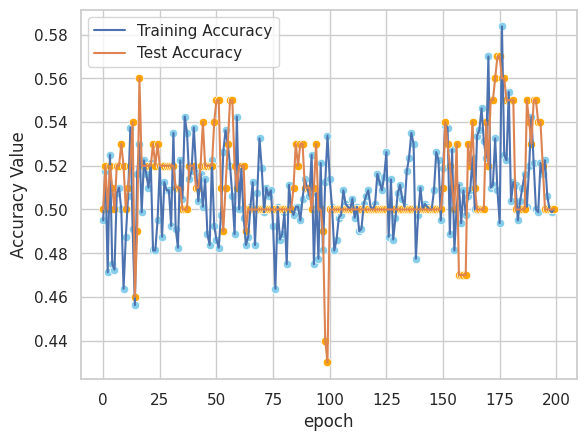

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

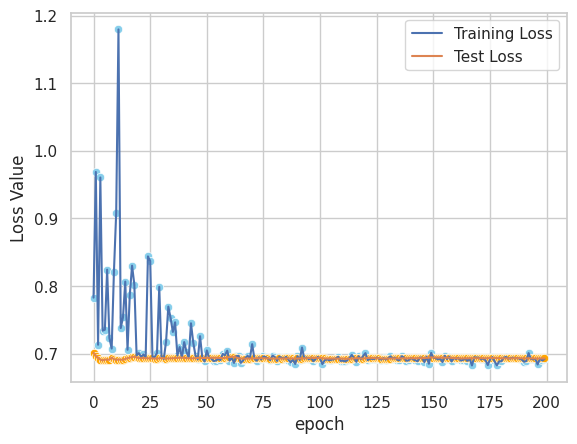

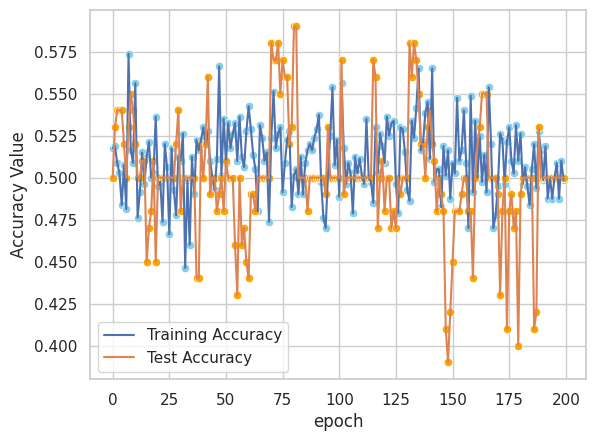

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

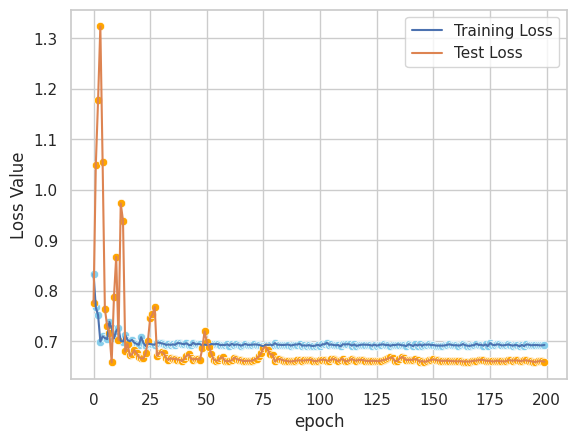

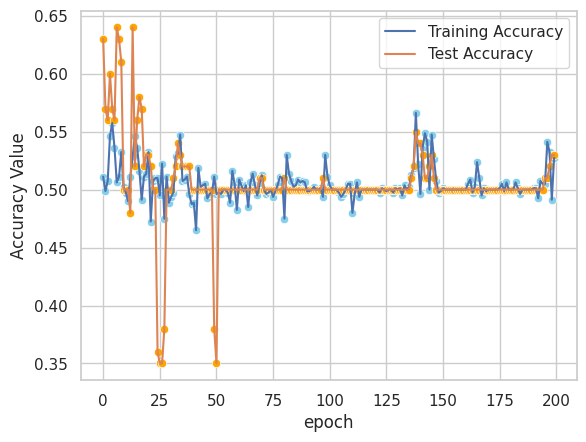

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  26  24  21  29      0.55   0.553191    0.52          0.58  0.536082   

   auc_score  
0       0.55  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  48   2  45   5      0.53   0.516129    0.96           0.1  0.671329   

   auc_score  
0       0.53  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  48   2  50   0      0.48   0.489796    0.96          0.00  0.648649   
1  42   8  38  12      0.54   0.525000    0.84          0.24  0.646154   
2  19  31   3  47      0.66   0.863636    0.38          0.94  0.527778   
3  18  32  11  39      0.57   0.620690    0.36          0.78  0.455696   
4  23  27  19  31      0.54   0.547619    0.46          0.62  0.500000   
5  47   3  41   9      0.56   0.534091    0.94          0.18  0.681159   
6  47   3  43   7      0.54   0.522222    0.94          0.14  0.671429   
7  28  22  17  33      0.61   0.622

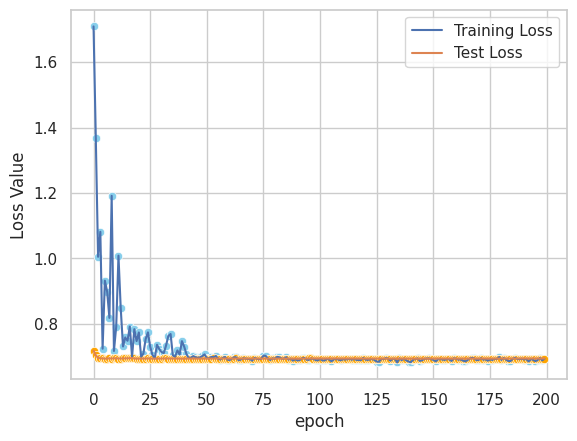

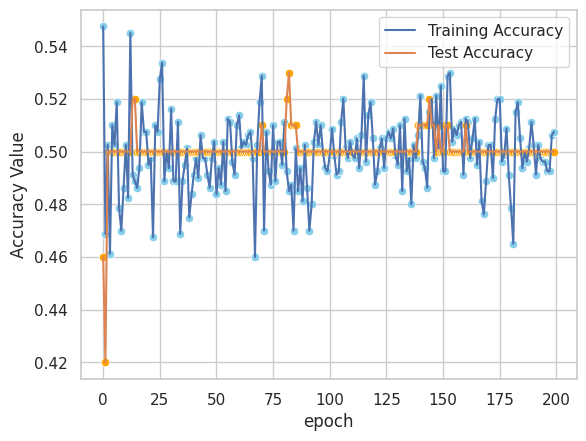

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
1  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
2  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
3  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
4  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
5  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
6  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   
7  50   0  50   0       0.5        

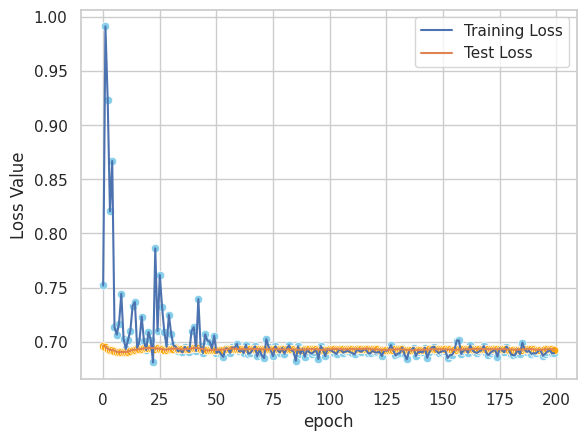

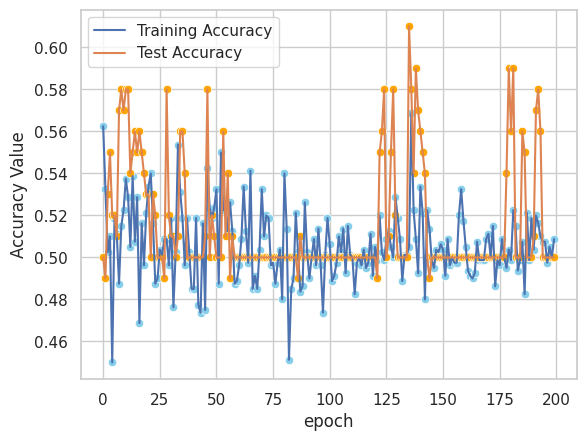

test
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
val
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0       0.5        0.5     1.0           0.0  0.666667   

   auc_score  
0        0.5  
train
   TP  FN  FP  TN  accuracy  precision  recall  especificity        f1  \
0  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
1  50   0  48   2      0.52   0.510204     1.0          0.04  0.675676   
2  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
3  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
4  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
5  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
6  50   0  50   0      0.50   0.500000     1.0          0.00  0.666667   
7  50   0  50   0      0.50   0.500

In [75]:
aux3 = train_and_test(grafos3, 10)

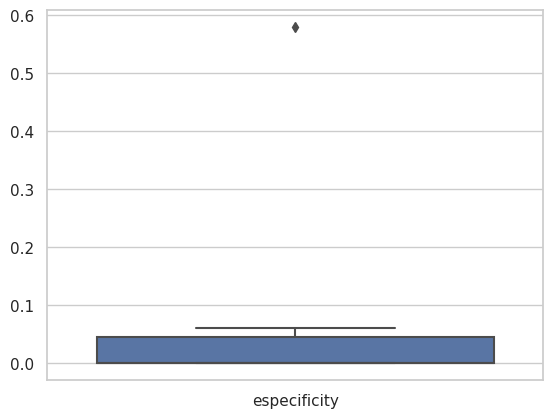

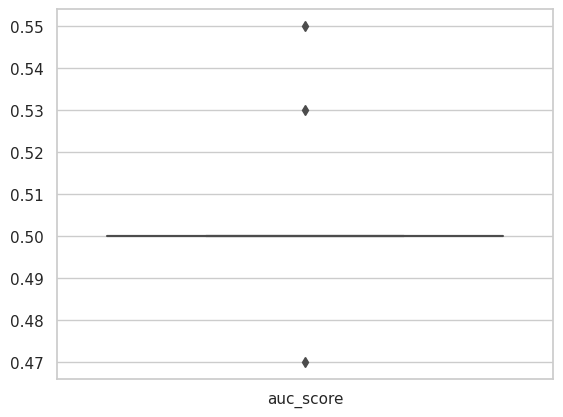

In [76]:
df3 = aux3[0]["test"]

for i in range(1,10):
    p = aux3[i]["test"]
    df3 = pd.concat([df3, p], ignore_index=True)
    
sns.set_theme(style="whitegrid")
boxplot1 = sns.boxplot(data=df3.iloc[:,7:8]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_especificity_{names[j]}.png'))                             
plt.clf()
    
sns.set_theme(style="whitegrid")
boxplot2 = sns.boxplot(data=df3.iloc[:,9:10]) 
plt.show()
#plt.savefig(os.path.join(joinDirectorio,f'{str(NOMBRE_PRUEBA)}_auc_{names[j]}.png'))                             
plt.clf()

# Comparación de los tres

In [77]:
os.listdir("/root/spektral/datasets/Carson_SyntheticGraphs/")

['10AvgDegree_3Lambda_0.5Mu_2Features_100Nodes_2Classes_10Graphs',
 '10AvgDegree_1Lambda_0Mu_2Features_100Nodes_2Classes_10Graphs',
 '10AvgDegree_2Lambda_0.25Mu_2Features_100Nodes_2Classes_10Graphs']

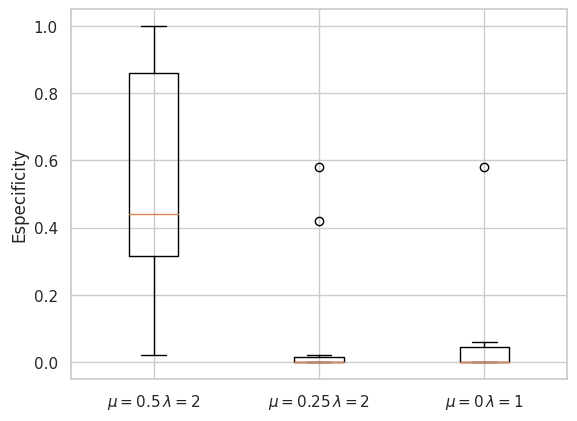

In [87]:
datos1 = np.reshape(np.array(df1.iloc[:,7:8]), -1)
datos2 = np.reshape(np.array(df2.iloc[:,7:8]), -1)
datos3 = np.reshape(np.array(df3.iloc[:,7:8]), -1)

# Graficar los boxplots
plt.boxplot([datos1, datos2, datos3])

# Añadir etiquetas
plt.xticks([1, 2, 3], [r'$\mu=0.5 \, \lambda=2$', r'$\mu=0.25 \, \lambda=2$', r'$\mu=0 \, \lambda=1$'])
plt.ylabel('Especificity')

plt.show()

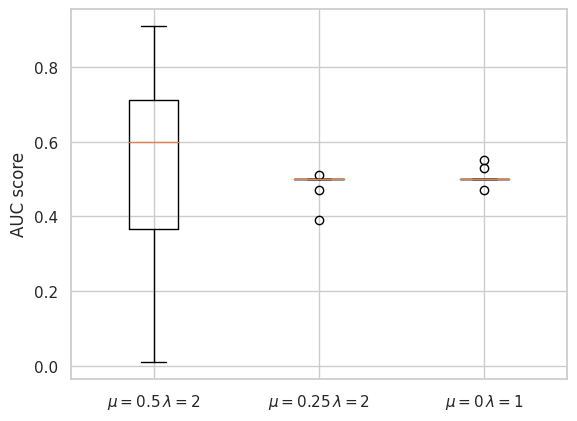

In [88]:
datos1 = np.reshape(np.array(df1.iloc[:,9:10]), -1)
datos2 = np.reshape(np.array(df2.iloc[:,9:10]), -1)
datos3 = np.reshape(np.array(df3.iloc[:,9:10]), -1)

# Graficar los boxplots
plt.boxplot([datos1, datos2, datos3])

# Añadir etiquetas
plt.xticks([1, 2, 3], [r'$\mu=0.5 \, \lambda=2$', r'$\mu=0.25 \, \lambda=2$', r'$\mu=0 \, \lambda=1$'])
plt.ylabel('AUC score')

plt.show()

# Clase modificada para pasarle argumentos (viejo, no sigue a Carson)

In [ ]:
class synthetic_Dir_NoBalanced_clasesSep(Dataset): # modificacion 2024 para cacic-springer
    
    def __init__(self, num_nodes, n_communities, n_features, edge_prob_matrix, node_feature_means,\
                                  n_graphs, infected_percent, seed, feature_cov_matrix=None,flattened = False, **kwargs):
        self.num_nodes = num_nodes
        self.n_communities = n_communities
        self.n_features = n_features
        self.edge_prob_matrix = edge_prob_matrix
        self.node_feature_means = node_feature_means
        self.num_graphs = n_graphs
        self.infected_percent = infected_percent
        self.seed = seed
        self.feature_cov_matrix = feature_cov_matrix
        self.flattened = flattened
        super().__init__(**kwargs)

    @property
    def path(self):
        return os.path.join(DATASET_FOLDER, "syntheticGraphs", f'{self.__class__.__name__}_{self.num_nodes}nodes_{self.infected_percent}percent')
    
    @property
    def n_infected(self): 
        return int( (self.infected_percent * self.num_nodes) / 100 )
    
    
    # Getter para obtener los argumentos utilizados
    def get_args(self):
        return {"num_nodes": self.num_nodes, "n_communities": self.n_communities, "n_features": self.n_features, \ 
                "edge_prob_matrix": self.edge_prob_matrix, "node_feature_means": self.node_feature_means, \
                "num_graphs": self.num_graphs, "infected_percent": self.infected_percent, "seed": self.seed, \
                "feature_cov_matrix": self.feature_cov_matrix, "flattened": self.flattened}
    
    # Setter para actualizar los argumentos y forzar una nueva descarga
    def set_args(self, new_kwargs):
        # Verificar si los nuevos argumentos son diferentes a los actuales
        if new_kwargs != self._kwargs:
            # Borrar los datos existentes y marcar como no descargado
            self.delete()
            self._kwargs = new_kwargs

    
    def download(self):
        os.makedirs(self.path)
        
        def generate_synthetic_graph_csbm(num_nodes, n_communities, n_features, edge_prob_matrix, node_feature_means,\
                                  infected_percent, seed, feature_cov_matrix):
            # Assign nodes to communities
            np.random.seed(seed)
            indices = np.random.choice(num_nodes, self.n_infected, replace=False)
            #indices = [np.random.randint(0,num_nodes) for i in range(n_infected)] ## 2024: Queda comentada porque no asegura que sea sin repeticio,
                                                                                 ## por lo que podrían haber menos de n_infected nodos de clase minoritaria
            communities = np.array([int(j in indices) for j in range(num_nodes)])

            # Generate node features
            if feature_cov_matrix is None:
                feature_cov_matrix = np.eye(n_features)
            features = np.zeros((num_nodes, n_features))
            for k in range(n_communities):
                nodes_in_community = np.where(communities == k)[0]
                features[nodes_in_community] = np.random.multivariate_normal(node_feature_means[k], feature_cov_matrix,\
                                                                             len(nodes_in_community))

            # Compute community membership probabilities based on node features
            community_membership_probs = softmax(features @ node_feature_means.T, axis=1)

            # Generate edges based on community membership probabilities
            adjacency_matrix = np.zeros((num_nodes, num_nodes))
            for i in range(num_nodes):
                for j in range(num_nodes):
                    if i == j:
                        continue
                    community_i = communities[i]
                    community_j = communities[j]
                    edge_prob = edge_prob_matrix[community_i, community_j] * community_membership_probs[i, community_j] * community_membership_probs[j, community_i]
                    adjacency_matrix[i, j] = np.random.binomial(1, edge_prob)

            labels = tf.keras.utils.to_categorical(communities)
            adjacency_matrix = sparse.csr_matrix(adjacency_matrix)
            return Graph(x=features, a=adjacency_matrix, y=labels)
        
        graphs1 = [generate_synthetic_graph_csbm(self.num_nodes, self.n_communities, self.n_features, self.edge_prob_matrix, self.node_feature_means, self.infected_percent, self.seed[i], self.feature_cov_matrix) for i in range(self.num_graphs)]
        for j in range(self.num_graphs):
            filename = os.path.join(self.path, f'graph_Dir_{self.num_nodes}nodes_NoBalanced_{self.n_infected}a{self.num_nodes}_clasesSep_0{j}.npz')
            np.savez(filename, x=graphs1[j].x, a=graphs1[j].a, y=graphs1[j].y)
        
        # Free memory
        del graphs1
        gc.collect()
        

    def read(self):
        # We must return a list of Graph objects
        output = []

        for j in range(10):
            data = np.load(os.path.join(self.path, f'graph_Dir_{self.num_nodes}nodes_NoBalanced_{self.n_infected}a{self.num_nodes}_clasesSep_0{j}.npz'), allow_pickle=True)
            output.append(
                Graph(x=data['x'], a=data['a'][()], y=data['y']) # también puede ser a=data['a'].item()
            )

        return output
    
    
    #def delete(self):
    #    if os.path.exists(self.path):
    #        os.remove(self.path)

In [113]:
num_graphs = 10
n_nodes = 100
n_features = 2
n_classes = 2
infected_percent = 1
# Probability matrix for edges between communities
edge_prob_matrix = np.array([
                             [0.8, 0.2],
                             [0.3, 0.7]
                            ])
# Node feature means for each community
node_feature_means = np.array([
                               [2, 1], #, 0, 0, 0],
                               [1, 2] #, 0, 0, 0]
                              ])
        
semillas = [123, 234, 345, 456, 567, 679, 789, 321, 654, 987]

In [114]:
datosPrueba=synthetic_Dir_NoBalanced_clasesSep(n_nodes, n_classes, n_features, edge_prob_matrix, node_feature_means, num_graphs, infected_percent, semillas, feature_cov_matrix=None, flattened=False)
